Loaded 20 images and 20 masks.
Epoch 1/50


/opt/anaconda3/lib/python3.12/site-packages/keras/src/models/functional.py:225: UserWarning: The structure of `inputs` doesn't match the expected structure: ['keras_tensor']. Received: the structure of inputs=*
  warnings.warn(


1/1 ━━━━━━━━━━━━━━━━━━━━ 20s 20s/step - accuracy: 0.2931 - loss: 0.6954 - val_accuracy: 0.6992 - val_loss: 0.6918
Epoch 2/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 18s 18s/step - accuracy: 0.6987 - loss: 0.6918 - val_accuracy: 0.6990 - val_loss: 0.6886
Epoch 3/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 19s 19s/step - accuracy: 0.6988 - loss: 0.6889 - val_accuracy: 0.6952 - val_loss: 0.6854
Epoch 4/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 20s 20s/step - accuracy: 0.6953 - loss: 0.6859 - val_accuracy: 0.6934 - val_loss: 0.6820
Epoch 5/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 21s 21s/step - accuracy: 0.6937 - loss: 0.6827 - val_accuracy: 0.6923 - val_loss: 0.6783
Epoch 6/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 21s 21s/step - accuracy: 0.6929 - loss: 0.6793 - val_accuracy: 0.6912 - val_loss: 0.6746
Epoch 7/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 31s 31s/step - accuracy: 0.6921 - loss: 0.6758 - val_accuracy: 0.6902 - val_loss: 0.6707
Epoch 8/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 22s 22s/step - accuracy: 0.6911 - loss: 0.6723 - val_accuracy: 0.6892 - val_loss: 0.6667
Epoch 9/50


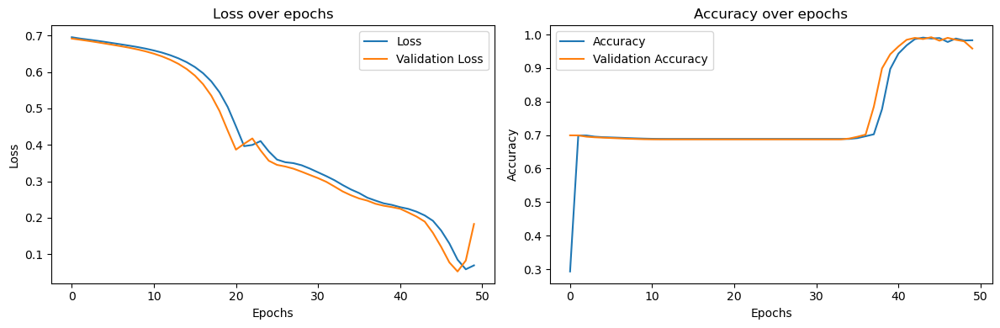

In [18]:
import os
import numpy as np
import cv2
from sklearn.model_selection import train_test_split
from tensorflow.keras import layers, models, losses
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import load_img, img_to_array
import matplotlib.pyplot as plt

# Set paths
image_dir = "/Users/aakash/Documents/Python/Heart_risk/DRIVE/training/images"
mask_dir = "/Users/aakash/Documents/Python/Heart_risk/DRIVE/training/mask"

# Preprocess images and masks
def preprocess_images(image_dir, mask_dir):
    images = []
    masks = []

    for filename in sorted(os.listdir(image_dir)):
        if filename.endswith(".tif") or filename.endswith(".gif"):
            # Load image
            image_path = os.path.join(image_dir, filename)
            mask_path = os.path.join(mask_dir, filename.replace("training.tif", "training_mask.gif"))

            try:
                image = load_img(image_path, color_mode='grayscale', target_size=(256, 256))
                mask = load_img(mask_path, color_mode='grayscale', target_size=(256, 256))

                # Convert images to arrays
                image_array = img_to_array(image) / 255.0  # Normalize
                mask_array = img_to_array(mask) / 255.0   # Normalize

                images.append(image_array)
                masks.append(mask_array)

            except Exception as e:
                print(f"Error loading {image_path} or {mask_path}: {e}")

    return np.array(images), np.array(masks)

# Load and preprocess the dataset
X, Y = preprocess_images(image_dir, mask_dir)

# Check if data is loaded correctly
if X.size == 0 or Y.size == 0:
    print("No images or masks were loaded correctly. Please check your dataset.")
else:
    print(f"Loaded {X.shape[0]} images and {Y.shape[0]} masks.")

# Split dataset into train and validation sets
X_train, X_val, Y_train, Y_val = train_test_split(X, Y, test_size=0.2, random_state=42)

# U-Net model definition
def unet_model(input_size=(256, 256, 1)):
    inputs = layers.Input(input_size)

    # Encoder
    c1 = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(inputs)
    c1 = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(c1)
    p1 = layers.MaxPooling2D((2, 2))(c1)

    c2 = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(p1)
    c2 = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(c2)
    p2 = layers.MaxPooling2D((2, 2))(c2)

    c3 = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(p2)
    c3 = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(c3)
    p3 = layers.MaxPooling2D((2, 2))(c3)

    c4 = layers.Conv2D(512, (3, 3), activation='relu', padding='same')(p3)
    c4 = layers.Conv2D(512, (3, 3), activation='relu', padding='same')(c4)
    p4 = layers.MaxPooling2D((2, 2))(c4)

    # Bottleneck
    c5 = layers.Conv2D(1024, (3, 3), activation='relu', padding='same')(p4)
    c5 = layers.Conv2D(1024, (3, 3), activation='relu', padding='same')(c5)

    # Decoder
    u6 = layers.Conv2DTranspose(512, (2, 2), strides=(2, 2), padding='same')(c5)
    u6 = layers.concatenate([u6, c4])
    c6 = layers.Conv2D(512, (3, 3), activation='relu', padding='same')(u6)
    c6 = layers.Conv2D(512, (3, 3), activation='relu', padding='same')(c6)

    u7 = layers.Conv2DTranspose(256, (2, 2), strides=(2, 2), padding='same')(c6)
    u7 = layers.concatenate([u7, c3])
    c7 = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(u7)
    c7 = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(c7)

    u8 = layers.Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(c7)
    u8 = layers.concatenate([u8, c2])
    c8 = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(u8)
    c8 = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(c8)

    u9 = layers.Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(c8)
    u9 = layers.concatenate([u9, c1])
    c9 = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(u9)
    c9 = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(c9)

    outputs = layers.Conv2D(1, (1, 1), activation='sigmoid')(c9)

    model = models.Model(inputs=[inputs], outputs=[outputs])
    return model

# Create and compile U-Net model
unet = unet_model()
unet.compile(optimizer=Adam(learning_rate=1e-4), loss=losses.BinaryCrossentropy(), metrics=['accuracy'])

# Train the model
history = unet.fit(X_train, Y_train, validation_data=(X_val, Y_val), batch_size=16, epochs=50)

# Save the model
unet.save('unet_model.h5')

# Plot training history
plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.plot(history.history['loss'], label='Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Loss over epochs')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(history.history['accuracy'], label='Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Accuracy over epochs')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

plt.tight_layout()
plt.show()


Loaded 20 images and 20 masks.
Epoch 1/50


/opt/anaconda3/lib/python3.12/site-packages/keras/src/models/functional.py:225: UserWarning: The structure of `inputs` doesn't match the expected structure: ['keras_tensor_64']. Received: the structure of inputs=*
  warnings.warn(


1/1 ━━━━━━━━━━━━━━━━━━━━ 22s 22s/step - accuracy: 0.2768 - loss: 0.6937 - val_accuracy: 0.7015 - val_loss: 0.6892
Epoch 2/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 20s 20s/step - accuracy: 0.7008 - loss: 0.6895 - val_accuracy: 0.6928 - val_loss: 0.6850
Epoch 3/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 22s 22s/step - accuracy: 0.6927 - loss: 0.6855 - val_accuracy: 0.6897 - val_loss: 0.6811
Epoch 4/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 23s 23s/step - accuracy: 0.6904 - loss: 0.6819 - val_accuracy: 0.6878 - val_loss: 0.6772
Epoch 5/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 24s 24s/step - accuracy: 0.6891 - loss: 0.6783 - val_accuracy: 0.6873 - val_loss: 0.6732
Epoch 6/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 33s 33s/step - accuracy: 0.6887 - loss: 0.6745 - val_accuracy: 0.6872 - val_loss: 0.6688
Epoch 7/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 43s 43s/step - accuracy: 0.6885 - loss: 0.6705 - val_accuracy: 0.6872 - val_loss: 0.6643
Epoch 8/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 30s 30s/step - accuracy: 0.6885 - loss: 0.6663 - val_accuracy: 0.6872 - val_loss: 0.6593
Epoch 9/50


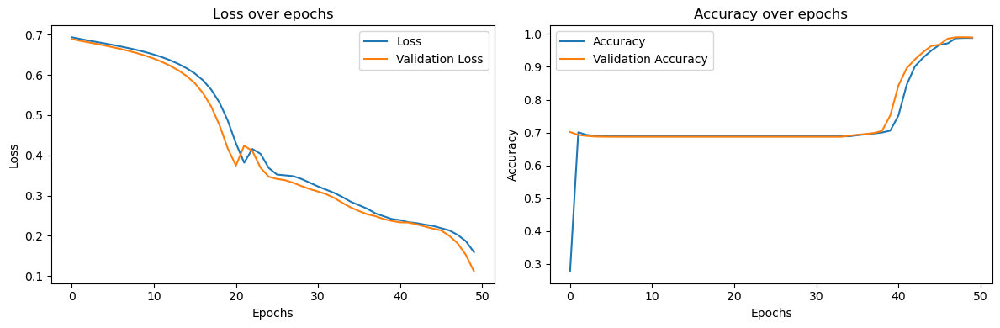

In [26]:
import os
import numpy as np
import cv2
from sklearn.model_selection import train_test_split
from tensorflow.keras import layers, models, losses
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import load_img, img_to_array
import matplotlib.pyplot as plt

# Set paths
image_dir = "/Users/aakash/Documents/Python/Heart_risk/DRIVE/training/images"
mask_dir = "/Users/aakash/Documents/Python/Heart_risk/DRIVE/training/mask"

# Preprocess images and masks
def preprocess_images(image_dir, mask_dir):
    images = []
    masks = []

    for filename in sorted(os.listdir(image_dir)):
        if filename.endswith(".tif") or filename.endswith(".gif"):
            # Load image and corresponding mask
            image_path = os.path.join(image_dir, filename)
            mask_path = os.path.join(mask_dir, filename.replace("training.tif", "training_mask.gif"))

            try:
                image = load_img(image_path, color_mode='grayscale', target_size=(256, 256))
                mask = load_img(mask_path, color_mode='grayscale', target_size=(256, 256))

                # Convert images to arrays and normalize
                image_array = img_to_array(image) / 255.0
                mask_array = img_to_array(mask) / 255.0

                images.append(image_array)
                masks.append(mask_array)

            except Exception as e:
                print(f"Error loading {image_path} or {mask_path}: {e}")

    return np.array(images), np.array(masks)

# Load and preprocess the dataset
X, Y = preprocess_images(image_dir, mask_dir)

# Check if data is loaded correctly
if X.size == 0 or Y.size == 0:
    print("No images or masks were loaded correctly. Please check your dataset.")
else:
    print(f"Loaded {X.shape[0]} images and {Y.shape[0]} masks.")

# Split dataset into train and validation sets
X_train, X_val, Y_train, Y_val = train_test_split(X, Y, test_size=0.2, random_state=42)

# U-Net model definition
def unet_model(input_size=(256, 256, 1)):
    inputs = layers.Input(input_size)

    # Encoder
    c1 = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(inputs)
    c1 = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(c1)
    p1 = layers.MaxPooling2D((2, 2))(c1)

    c2 = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(p1)
    c2 = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(c2)
    p2 = layers.MaxPooling2D((2, 2))(c2)

    c3 = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(p2)
    c3 = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(c3)
    p3 = layers.MaxPooling2D((2, 2))(c3)

    c4 = layers.Conv2D(512, (3, 3), activation='relu', padding='same')(p3)
    c4 = layers.Conv2D(512, (3, 3), activation='relu', padding='same')(c4)
    p4 = layers.MaxPooling2D((2, 2))(c4)

    # Bottleneck
    c5 = layers.Conv2D(1024, (3, 3), activation='relu', padding='same')(p4)
    c5 = layers.Conv2D(1024, (3, 3), activation='relu', padding='same')(c5)

    # Decoder
    u6 = layers.Conv2DTranspose(512, (2, 2), strides=(2, 2), padding='same')(c5)
    u6 = layers.concatenate([u6, c4])
    c6 = layers.Conv2D(512, (3, 3), activation='relu', padding='same')(u6)
    c6 = layers.Conv2D(512, (3, 3), activation='relu', padding='same')(c6)

    u7 = layers.Conv2DTranspose(256, (2, 2), strides=(2, 2), padding='same')(c6)
    u7 = layers.concatenate([u7, c3])
    c7 = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(u7)
    c7 = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(c7)

    u8 = layers.Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(c7)
    u8 = layers.concatenate([u8, c2])
    c8 = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(u8)
    c8 = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(c8)

    u9 = layers.Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(c8)
    u9 = layers.concatenate([u9, c1])
    c9 = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(u9)
    c9 = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(c9)

    outputs = layers.Conv2D(1, (1, 1), activation='sigmoid')(c9)

    model = models.Model(inputs=[inputs], outputs=[outputs])
    return model

# Create and compile U-Net model
unet = unet_model()
unet.compile(optimizer=Adam(learning_rate=1e-4), loss=losses.BinaryCrossentropy(), metrics=['accuracy'])

# Train the model
history = unet.fit(X_train, Y_train, validation_data=(X_val, Y_val), batch_size=16, epochs=50)

# Save the model
unet.save('unet_model.h5')

# Plot training history
plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.plot(history.history['loss'], label='Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Loss over epochs')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(history.history['accuracy'], label='Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Accuracy over epochs')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

plt.tight_layout()
plt.show()


Loaded 20 images and 20 masks.
Epoch 1/50


/opt/anaconda3/lib/python3.12/site-packages/keras/src/models/functional.py:225: UserWarning: The structure of `inputs` doesn't match the expected structure: ['keras_tensor_96']. Received: the structure of inputs=*
  warnings.warn(


1/1 ━━━━━━━━━━━━━━━━━━━━ 21s 21s/step - accuracy: 0.7032 - loss: 0.6888 - val_accuracy: 0.6931 - val_loss: 0.6858
Epoch 2/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 20s 20s/step - accuracy: 0.6937 - loss: 0.6864 - val_accuracy: 0.6896 - val_loss: 0.6833
Epoch 3/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 21s 21s/step - accuracy: 0.6907 - loss: 0.6839 - val_accuracy: 0.6880 - val_loss: 0.6806
Epoch 4/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 22s 22s/step - accuracy: 0.6892 - loss: 0.6815 - val_accuracy: 0.6875 - val_loss: 0.6777
Epoch 5/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 22s 22s/step - accuracy: 0.6887 - loss: 0.6788 - val_accuracy: 0.6872 - val_loss: 0.6746
Epoch 6/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 23s 23s/step - accuracy: 0.6886 - loss: 0.6758 - val_accuracy: 0.6872 - val_loss: 0.6712
Epoch 7/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 22s 22s/step - accuracy: 0.6885 - loss: 0.6727 - val_accuracy: 0.6872 - val_loss: 0.6674
Epoch 8/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 23s 23s/step - accuracy: 0.6885 - loss: 0.6692 - val_accuracy: 0.6872 - val_loss: 0.6633
Epoch 9/50


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 496ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 464ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 463ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 450ms/step
Average Vessel Thickness: 227.6102533538504


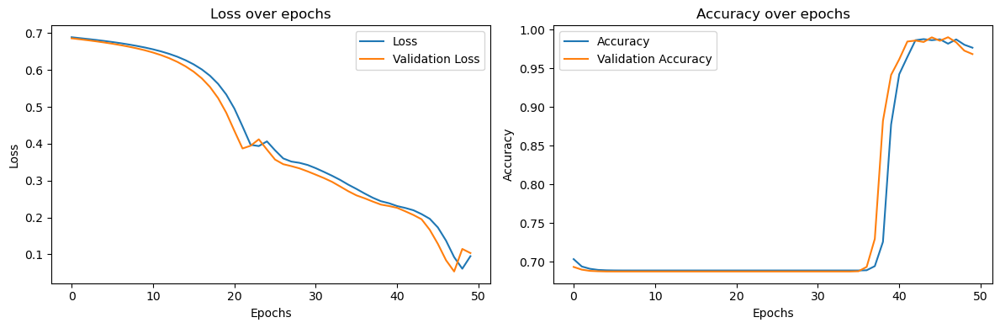

In [28]:
import os
import numpy as np
import cv2
from sklearn.model_selection import train_test_split
from tensorflow.keras import layers, models, losses
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from skimage.morphology import skeletonize
from scipy.ndimage import distance_transform_edt
import matplotlib.pyplot as plt

# Set paths
image_dir = "/Users/aakash/Documents/Python/Heart_risk/DRIVE/training/images"
mask_dir = "/Users/aakash/Documents/Python/Heart_risk/DRIVE/training/mask"

# Preprocess images and masks
def preprocess_images(image_dir, mask_dir):
    images = []
    masks = []

    for filename in sorted(os.listdir(image_dir)):
        if filename.endswith(".tif") or filename.endswith(".gif"):
            # Load image and corresponding mask
            image_path = os.path.join(image_dir, filename)
            mask_path = os.path.join(mask_dir, filename.replace("training.tif", "training_mask.gif"))

            try:
                image = load_img(image_path, color_mode='grayscale', target_size=(256, 256))
                mask = load_img(mask_path, color_mode='grayscale', target_size=(256, 256))

                # Convert images to arrays and normalize
                image_array = img_to_array(image) / 255.0
                mask_array = img_to_array(mask) / 255.0

                images.append(image_array)
                masks.append(mask_array)

            except Exception as e:
                print(f"Error loading {image_path} or {mask_path}: {e}")

    return np.array(images), np.array(masks)

# Load and preprocess the dataset
X, Y = preprocess_images(image_dir, mask_dir)

# Check if data is loaded correctly
if X.size == 0 or Y.size == 0:
    print("No images or masks were loaded correctly. Please check your dataset.")
else:
    print(f"Loaded {X.shape[0]} images and {Y.shape[0]} masks.")

# Split dataset into train and validation sets
X_train, X_val, Y_train, Y_val = train_test_split(X, Y, test_size=0.2, random_state=42)

# U-Net model definition
def unet_model(input_size=(256, 256, 1)):
    inputs = layers.Input(input_size)

    # Encoder
    c1 = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(inputs)
    c1 = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(c1)
    p1 = layers.MaxPooling2D((2, 2))(c1)

    c2 = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(p1)
    c2 = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(c2)
    p2 = layers.MaxPooling2D((2, 2))(c2)

    c3 = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(p2)
    c3 = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(c3)
    p3 = layers.MaxPooling2D((2, 2))(c3)

    c4 = layers.Conv2D(512, (3, 3), activation='relu', padding='same')(p3)
    c4 = layers.Conv2D(512, (3, 3), activation='relu', padding='same')(c4)
    p4 = layers.MaxPooling2D((2, 2))(c4)

    # Bottleneck
    c5 = layers.Conv2D(1024, (3, 3), activation='relu', padding='same')(p4)
    c5 = layers.Conv2D(1024, (3, 3), activation='relu', padding='same')(c5)

    # Decoder
    u6 = layers.Conv2DTranspose(512, (2, 2), strides=(2, 2), padding='same')(c5)
    u6 = layers.concatenate([u6, c4])
    c6 = layers.Conv2D(512, (3, 3), activation='relu', padding='same')(u6)
    c6 = layers.Conv2D(512, (3, 3), activation='relu', padding='same')(c6)

    u7 = layers.Conv2DTranspose(256, (2, 2), strides=(2, 2), padding='same')(c6)
    u7 = layers.concatenate([u7, c3])
    c7 = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(u7)
    c7 = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(c7)

    u8 = layers.Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(c7)
    u8 = layers.concatenate([u8, c2])
    c8 = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(u8)
    c8 = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(c8)

    u9 = layers.Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(c8)
    u9 = layers.concatenate([u9, c1])
    c9 = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(u9)
    c9 = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(c9)

    outputs = layers.Conv2D(1, (1, 1), activation='sigmoid')(c9)

    model = models.Model(inputs=[inputs], outputs=[outputs])
    return model

# Create and compile U-Net model
unet = unet_model()
unet.compile(optimizer=Adam(learning_rate=1e-4), loss=losses.BinaryCrossentropy(), metrics=['accuracy'])

# Train the model
history = unet.fit(X_train, Y_train, validation_data=(X_val, Y_val), batch_size=16, epochs=50)

# Save the model
unet.save('unet_model.h5')

# Function to calculate vessel thickness
def calculate_vessel_thickness(segmented_mask):
    """
    Given a segmented mask of blood vessels, calculate the average vessel thickness.
    Args:
        segmented_mask: binary mask of blood vessels (output of the model).
    Returns:
        average_thickness: The average thickness of the vessels.
    """
    # Convert the predicted mask to binary
    binary_mask = (segmented_mask > 0.5).astype(np.uint8)

    # Step 1: Skeletonize the vessels (reducing vessels to 1-pixel wide)
    skeleton = skeletonize(binary_mask)

    # Step 2: Apply distance transform to the binary vessel mask
    distance_map = distance_transform_edt(binary_mask)

    # Vessel thickness at each skeleton point is double the distance to the nearest edge
    vessel_thickness_map = skeleton * distance_map * 2  # Multiply by 2 to get diameter

    # Calculate average thickness of vessels
    vessel_thickness_values = vessel_thickness_map[vessel_thickness_map > 0]  # Exclude zero values
    average_thickness = np.mean(vessel_thickness_values)

    return average_thickness

# Example: After predicting with the U-Net model, calculate vessel thickness
def process_vessel_thickness(model, X_val):
    vessel_thicknesses = []
    for i in range(len(X_val)):
        # Predict vessel mask using the trained model
        y_pred = model.predict(np.expand_dims(X_val[i], axis=0))[0]
        
        # Calculate the vessel thickness for the predicted mask
        thickness = calculate_vessel_thickness(y_pred)
        vessel_thicknesses.append(thickness)
    
    return vessel_thicknesses

# Calculate vessel thickness on the validation set
vessel_thicknesses = process_vessel_thickness(unet, X_val)
average_thickness = np.mean(vessel_thicknesses)
print(f"Average Vessel Thickness: {average_thickness}")

# Plot training history
plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.plot(history.history['loss'], label='Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Loss over epochs')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(history.history['accuracy'], label='Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Accuracy over epochs')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

plt.tight_layout()
plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 443ms/step


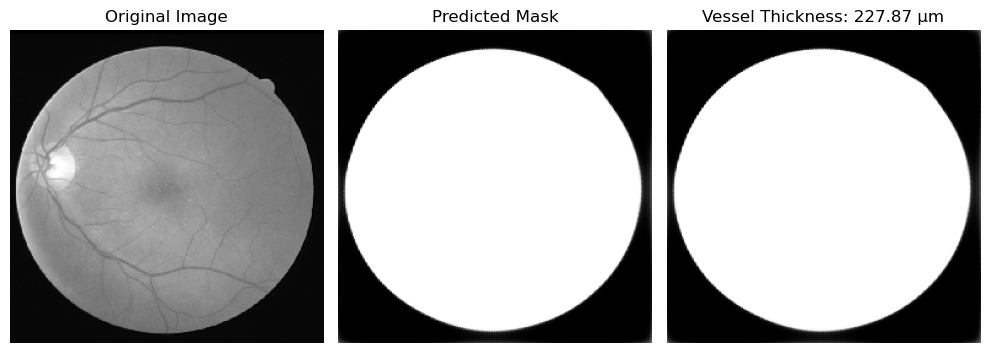

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step


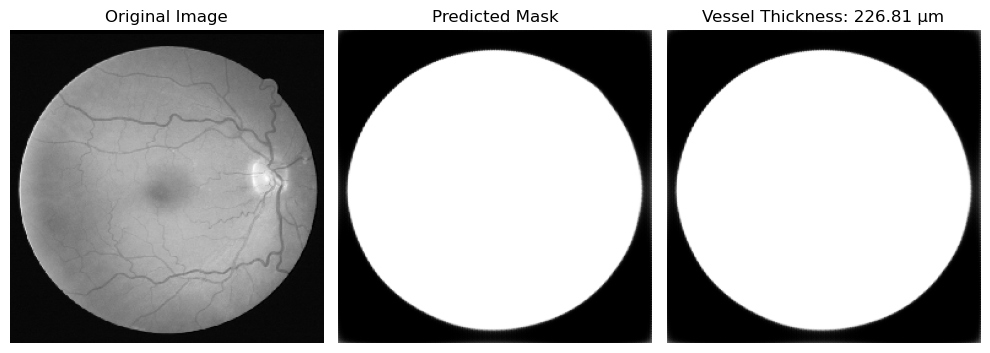

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


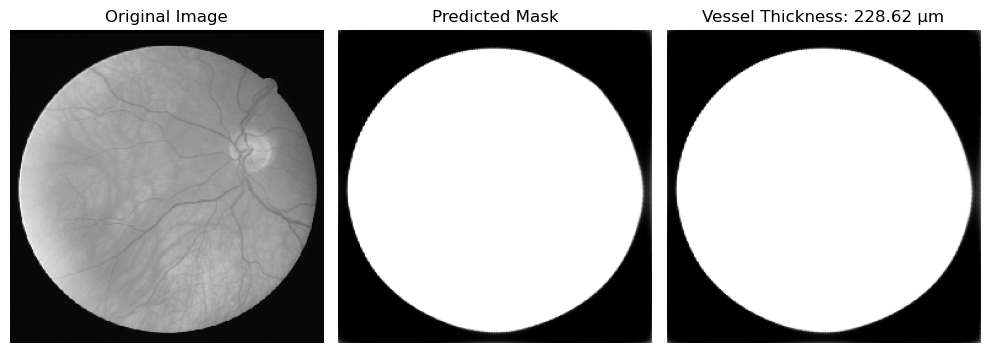

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 368ms/step


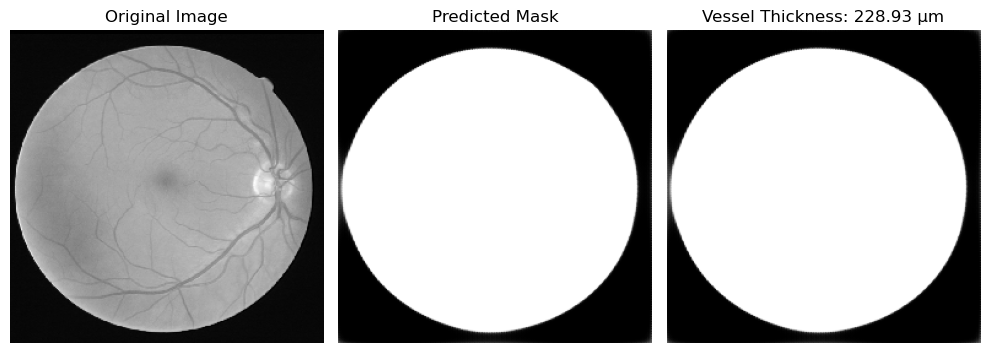

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 368ms/step


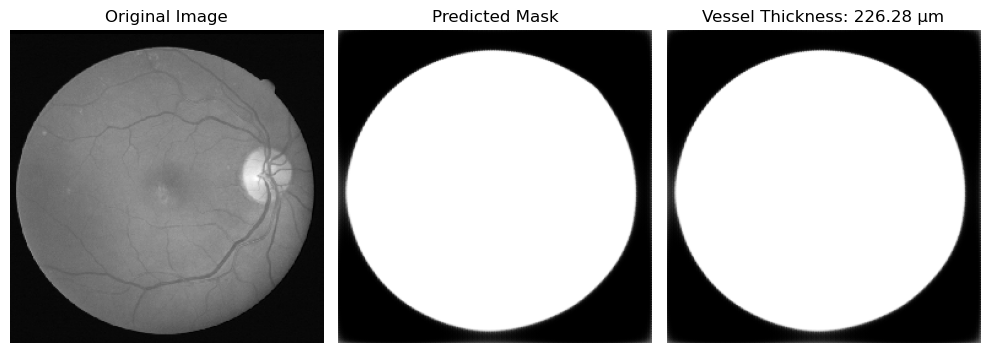

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


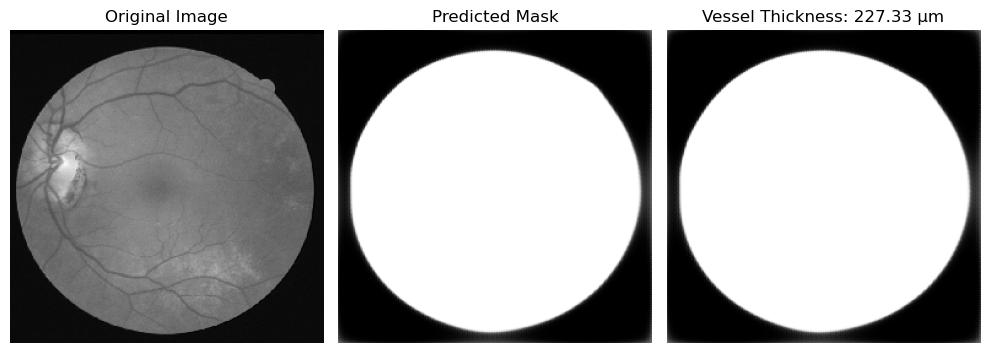

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 399ms/step


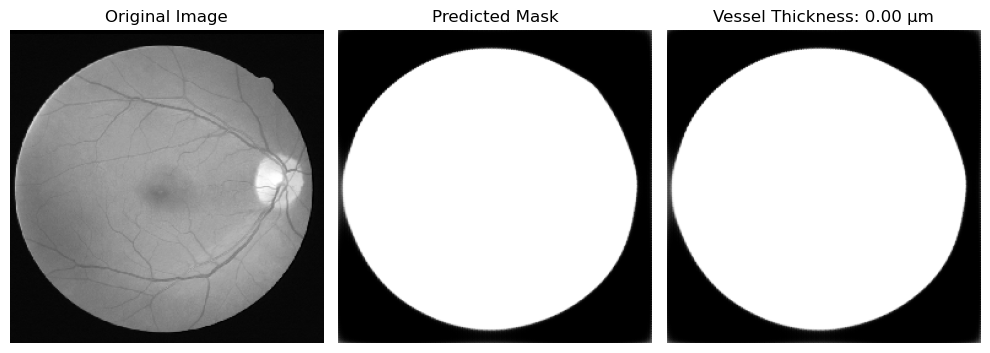

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step


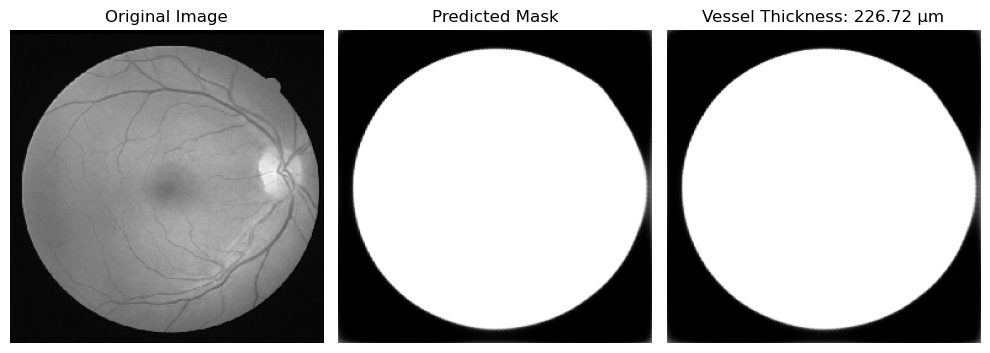

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step


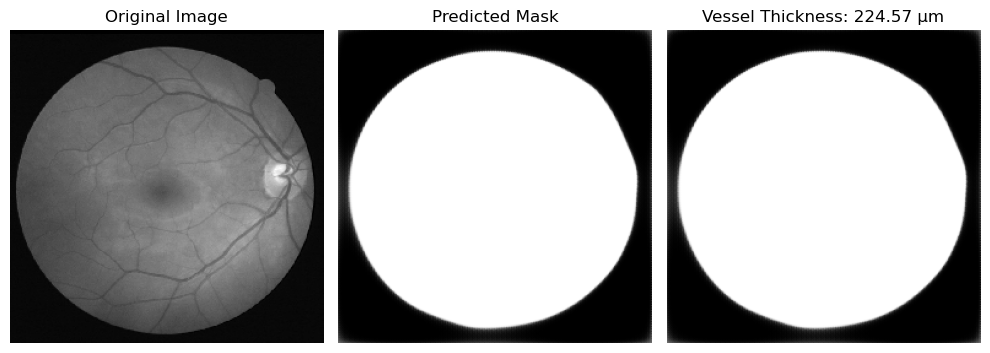

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 367ms/step


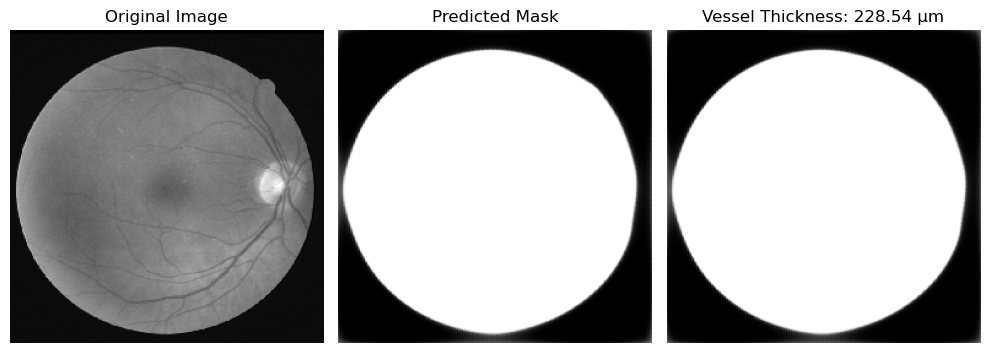

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 378ms/step


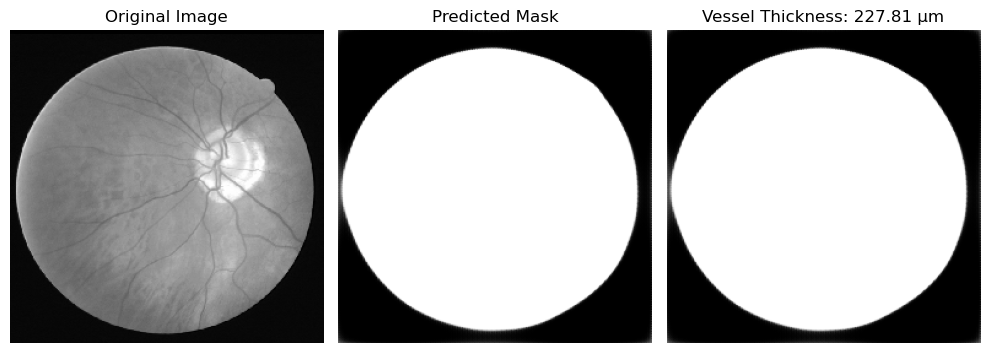

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step


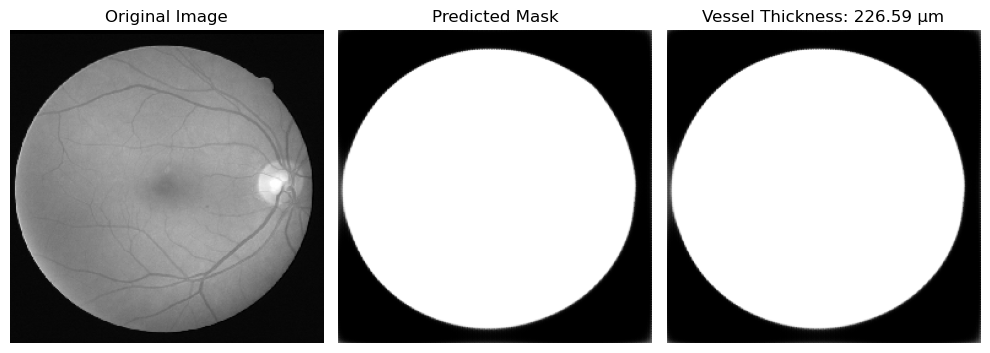

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 368ms/step


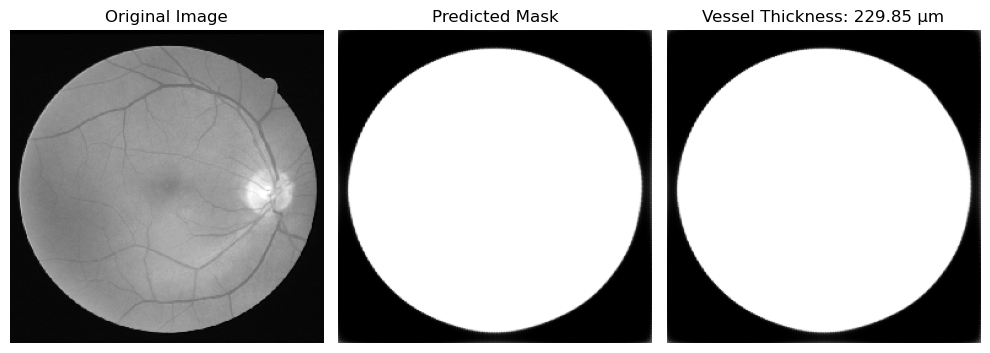

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 372ms/step


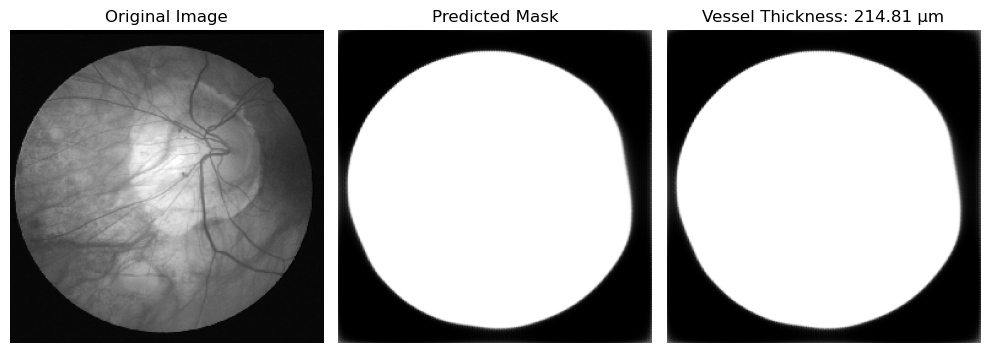

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 374ms/step


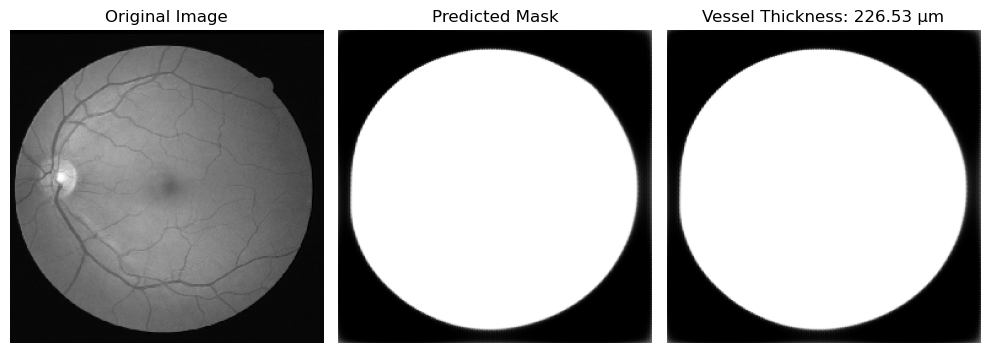

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step


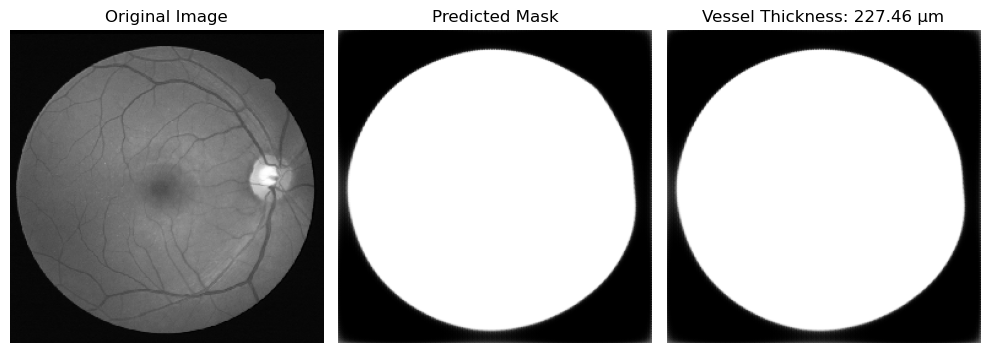

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step


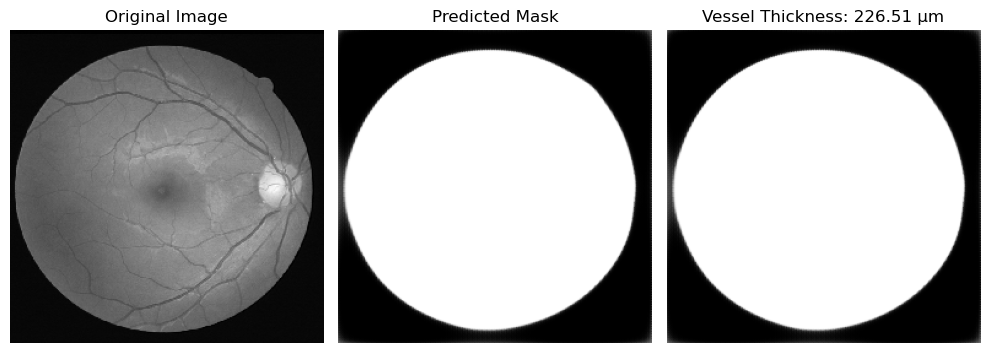

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step


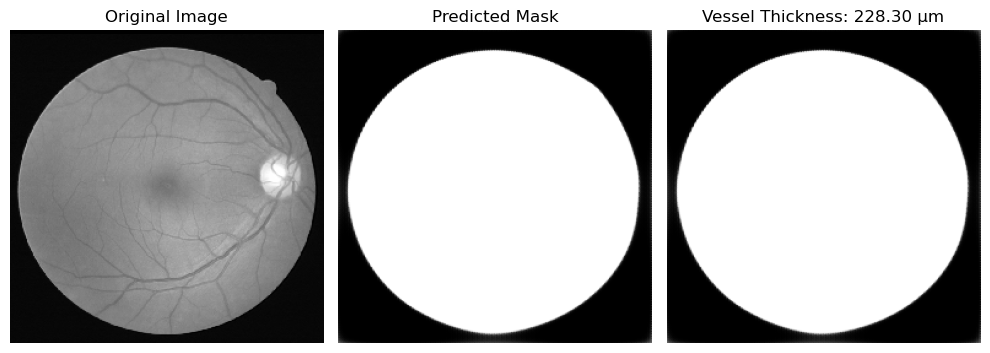

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 381ms/step


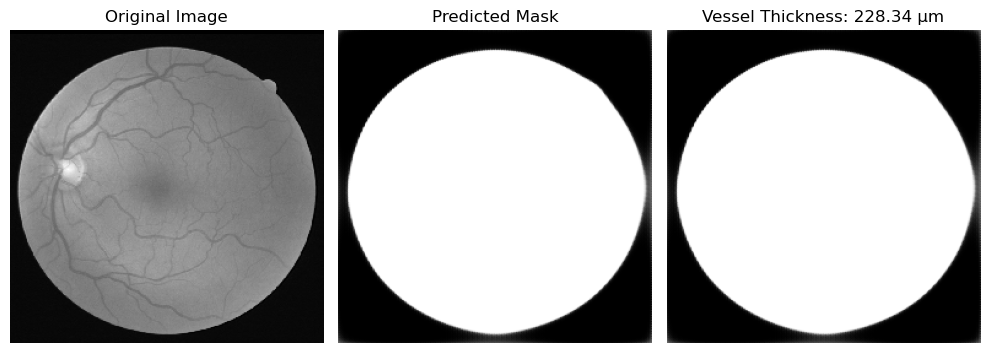

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 372ms/step


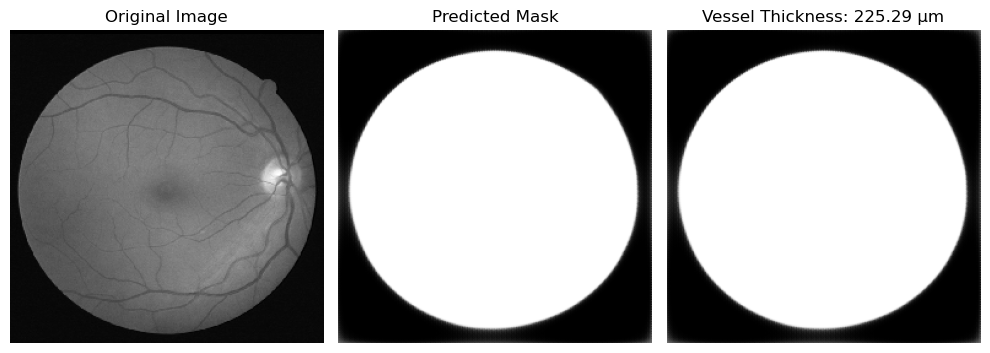

Average Vessel Thickness: 215.36 μm


In [32]:
import os
import numpy as np
import cv2
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from skimage.morphology import skeletonize
from scipy.ndimage import distance_transform_edt
import matplotlib.pyplot as plt

# Set paths
image_dir = "/Users/aakash/Documents/Python/Heart_risk/DRIVE/training/images"
mask_dir = "/Users/aakash/Documents/Python/Heart_risk/DRIVE/training/mask"
model_path = "unet_model.h5"

# Load the U-Net model
unet = load_model(model_path)

# Preprocess images and masks
def preprocess_images(image_dir):
    images = []
    
    for filename in sorted(os.listdir(image_dir)):
        if filename.endswith(".tif") or filename.endswith(".gif"):
            # Load image
            image_path = os.path.join(image_dir, filename)
            image = load_img(image_path, color_mode='grayscale', target_size=(256, 256))

            # Convert images to arrays and normalize
            image_array = img_to_array(image) / 255.0
            images.append(image_array)

    return np.array(images)

# Load and preprocess the dataset
X_val = preprocess_images(image_dir)

# Function to calculate vessel thickness
def calculate_vessel_thickness(segmented_mask):
    binary_mask = (segmented_mask > 0.5).astype(np.uint8)
    skeleton = skeletonize(binary_mask)
    distance_map = distance_transform_edt(binary_mask)
    vessel_thickness_map = skeleton * distance_map * 2
    vessel_thickness_values = vessel_thickness_map[vessel_thickness_map > 0]
    average_thickness = np.mean(vessel_thickness_values) if vessel_thickness_values.size > 0 else 0
    return average_thickness

# Test the model and calculate vessel thickness
def test_model_and_calculate_thickness(model, X_val):
    vessel_thicknesses = []
    for i in range(len(X_val)):
        # Predict vessel mask using the trained model
        y_pred = model.predict(np.expand_dims(X_val[i], axis=0))[0]

        # Calculate the vessel thickness for the predicted mask
        thickness = calculate_vessel_thickness(y_pred)
        vessel_thicknesses.append(thickness)

        # Visualize the results
        plt.figure(figsize=(10, 5))
        plt.subplot(1, 3, 1)
        plt.imshow(X_val[i].squeeze(), cmap='gray')
        plt.title('Original Image')
        plt.axis('off')

        plt.subplot(1, 3, 2)
        plt.imshow(y_pred.squeeze(), cmap='gray')
        plt.title('Predicted Mask')
        plt.axis('off')

        plt.subplot(1, 3, 3)
        plt.imshow(y_pred.squeeze(), cmap='gray')
        plt.title('Vessel Thickness: {:.2f} μm'.format(thickness))
        plt.axis('off')

        plt.tight_layout()
        plt.show()

    return vessel_thicknesses

# Calculate vessel thickness on the validation set
vessel_thicknesses = test_model_and_calculate_thickness(unet, X_val)
average_thickness = np.mean(vessel_thicknesses)
print(f"Average Vessel Thickness: {average_thickness:.2f} μm")


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


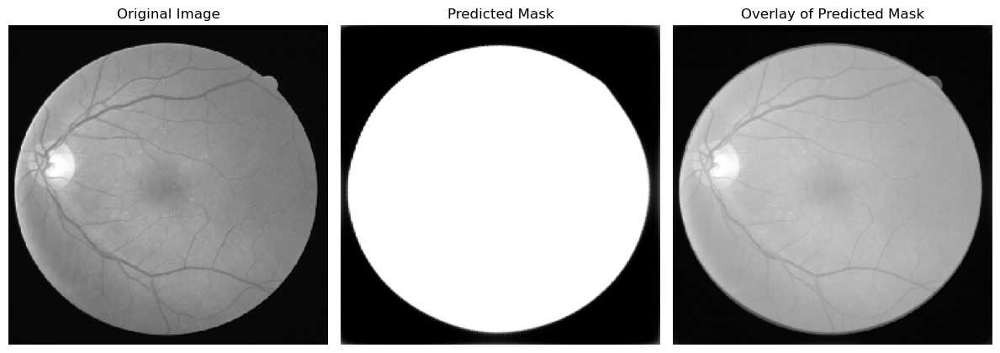

Processed 21_training.tif: Vessel Area = 43468, Avg Thickness (μm) = 493.01, Thickest Vessel (μm) = 583.20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step


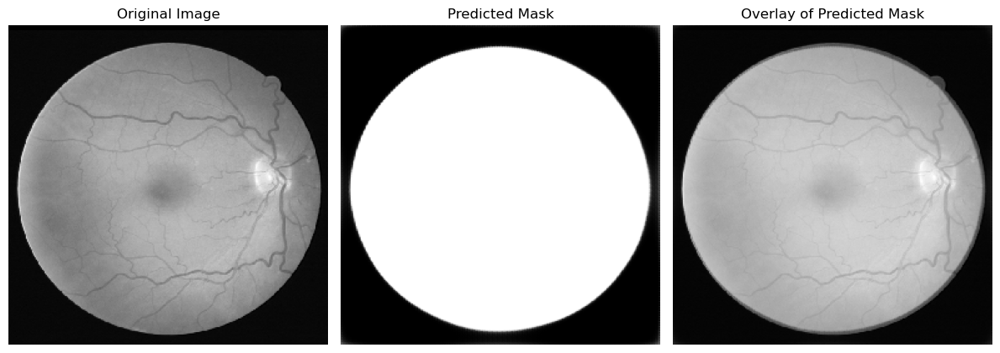

Processed 22_training.tif: Vessel Area = 42953, Avg Thickness (μm) = 490.18, Thickest Vessel (μm) = 580.80
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


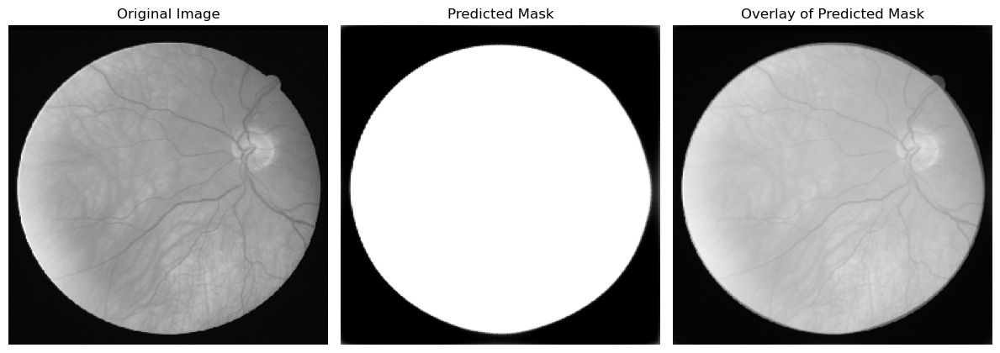

Processed 23_training.tif: Vessel Area = 43435, Avg Thickness (μm) = 490.57, Thickest Vessel (μm) = 580.80
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


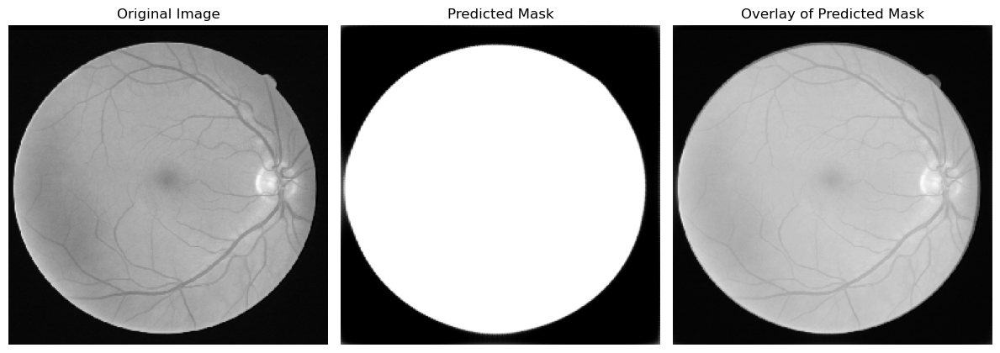

Processed 24_training.tif: Vessel Area = 43655, Avg Thickness (μm) = 492.13, Thickest Vessel (μm) = 583.20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


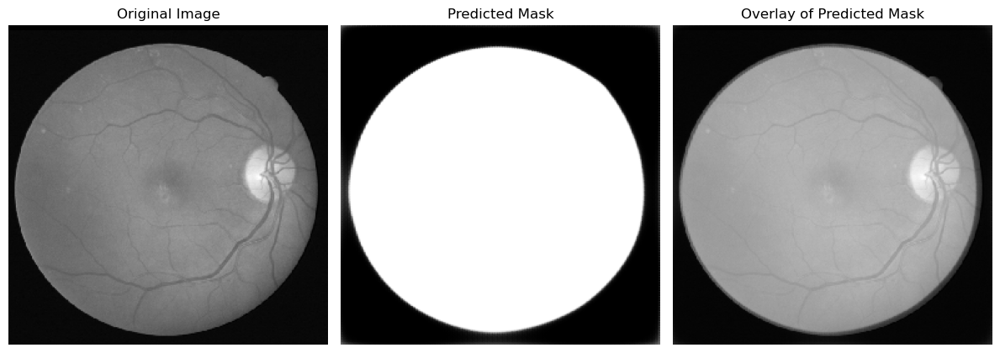

Processed 25_training.tif: Vessel Area = 42561, Avg Thickness (μm) = 484.59, Thickest Vessel (μm) = 571.20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


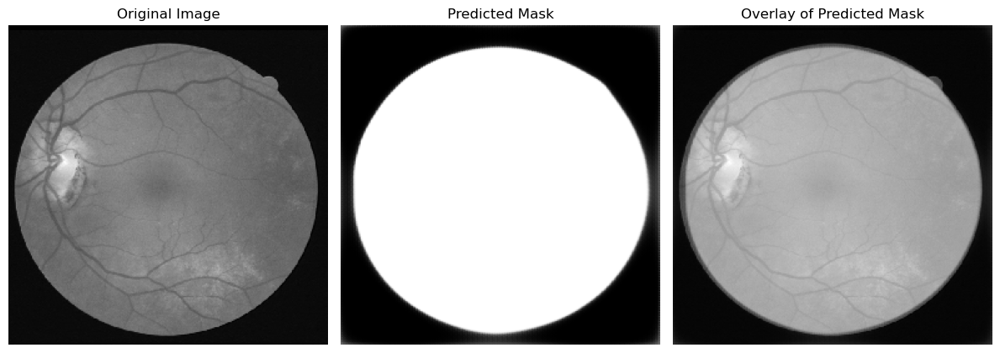

Processed 26_training.tif: Vessel Area = 42857, Avg Thickness (μm) = 486.49, Thickest Vessel (μm) = 571.20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


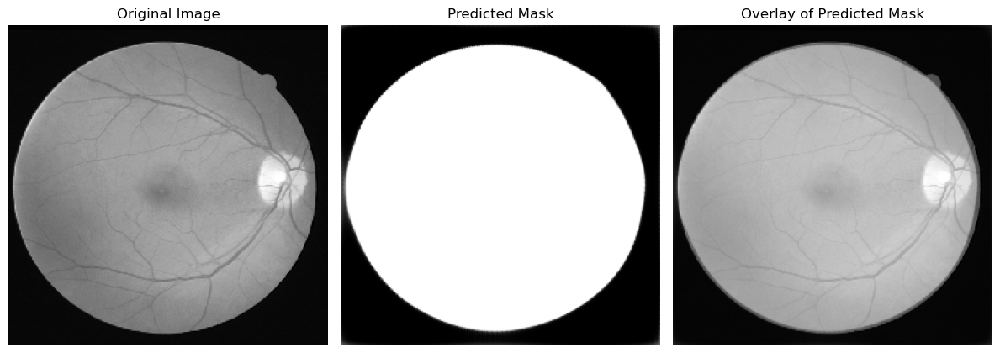

Processed 27_training.tif: Vessel Area = 43099, Avg Thickness (μm) = 489.05, Thickest Vessel (μm) = 580.80
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


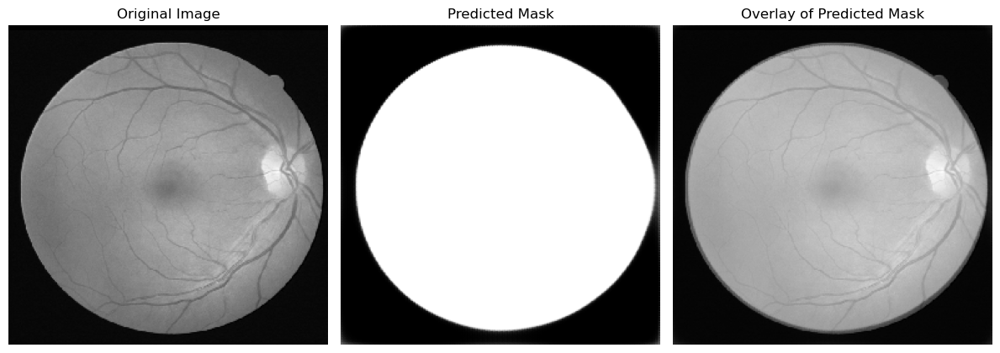

Processed 28_training.tif: Vessel Area = 42862, Avg Thickness (μm) = 488.65, Thickest Vessel (μm) = 578.40
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


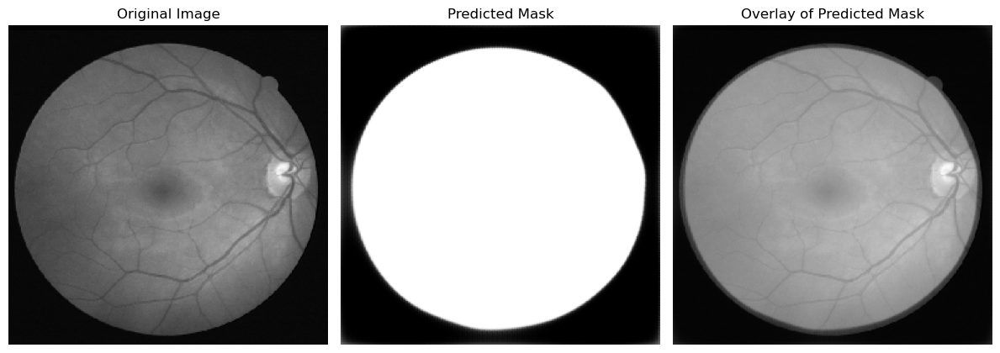

Processed 29_training.tif: Vessel Area = 41961, Avg Thickness (μm) = 482.56, Thickest Vessel (μm) = 568.80
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


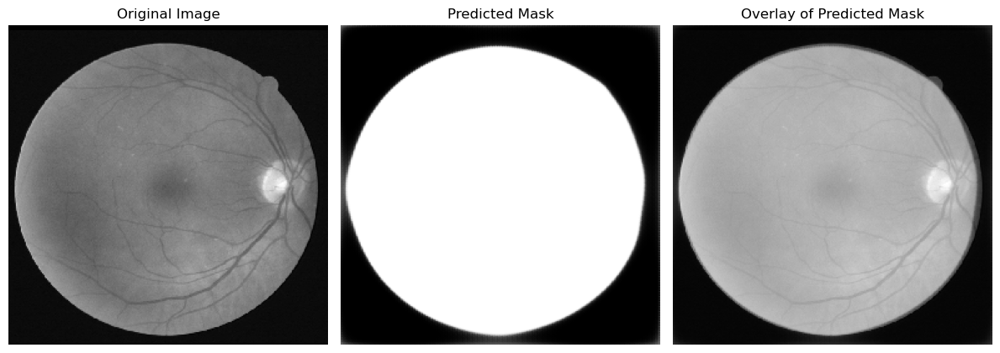

Processed 30_training.tif: Vessel Area = 43260, Avg Thickness (μm) = 488.13, Thickest Vessel (μm) = 578.40
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


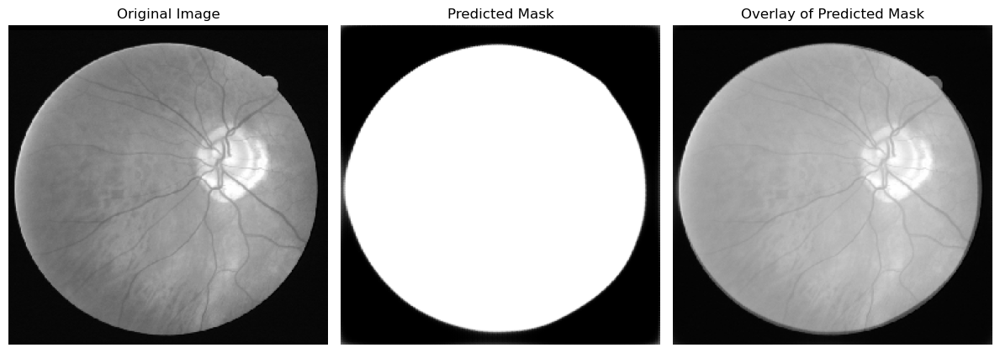

Processed 31_training.tif: Vessel Area = 43437, Avg Thickness (μm) = 491.86, Thickest Vessel (μm) = 585.60
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


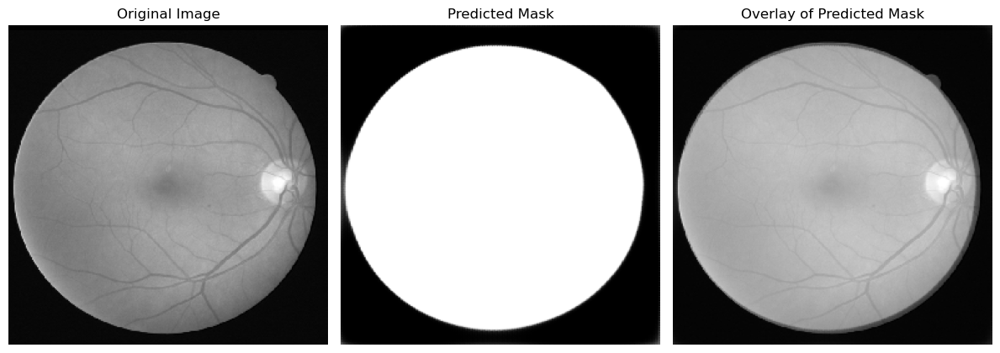

Processed 32_training.tif: Vessel Area = 42815, Avg Thickness (μm) = 488.48, Thickest Vessel (μm) = 578.40
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


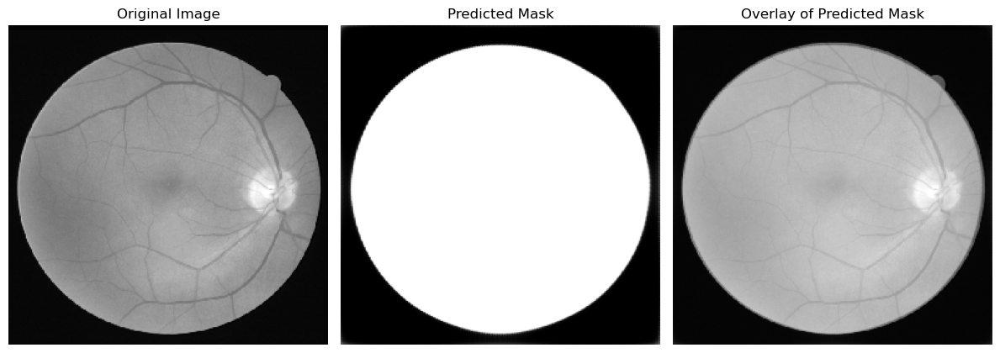

Processed 33_training.tif: Vessel Area = 43422, Avg Thickness (μm) = 489.52, Thickest Vessel (μm) = 578.40
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 386ms/step


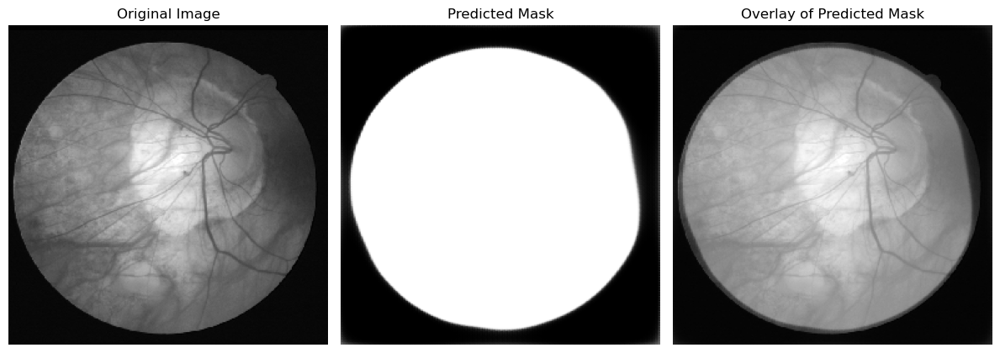

Processed 34_training.tif: Vessel Area = 41639, Avg Thickness (μm) = 477.87, Thickest Vessel (μm) = 559.20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


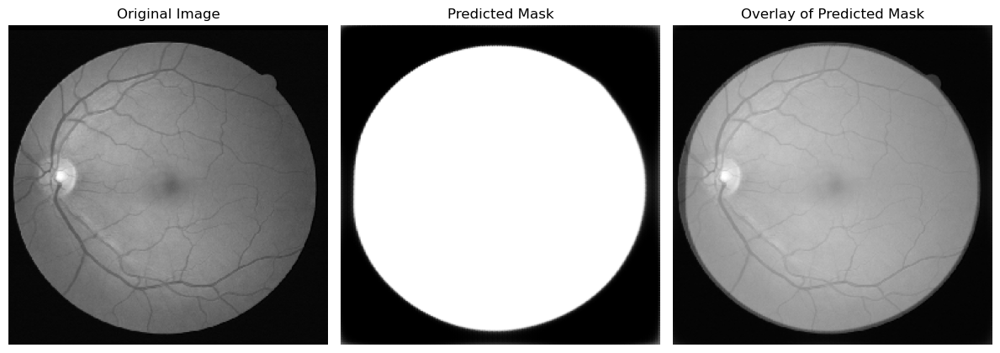

Processed 35_training.tif: Vessel Area = 42455, Avg Thickness (μm) = 483.32, Thickest Vessel (μm) = 566.40
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


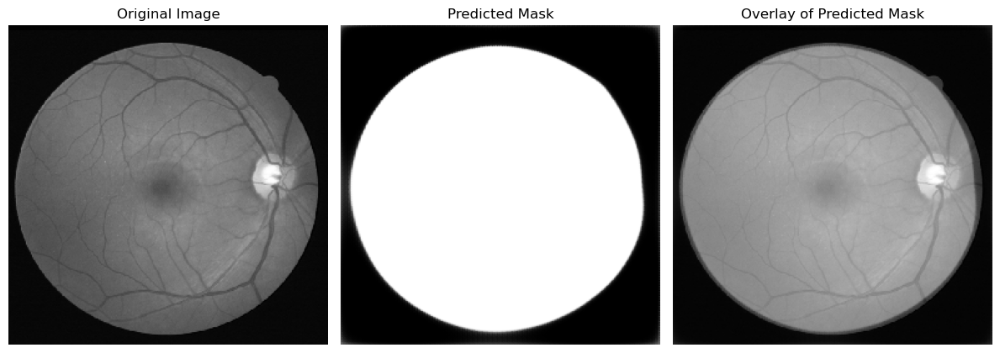

Processed 36_training.tif: Vessel Area = 42424, Avg Thickness (μm) = 482.59, Thickest Vessel (μm) = 566.40
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


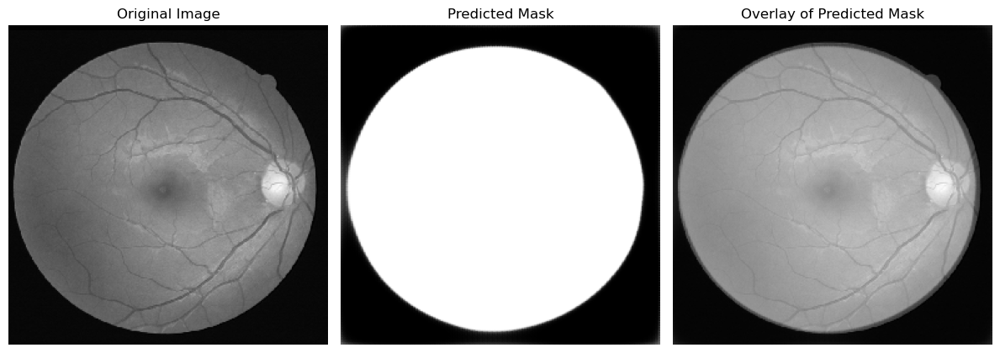

Processed 37_training.tif: Vessel Area = 42542, Avg Thickness (μm) = 485.14, Thickest Vessel (μm) = 576.00
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


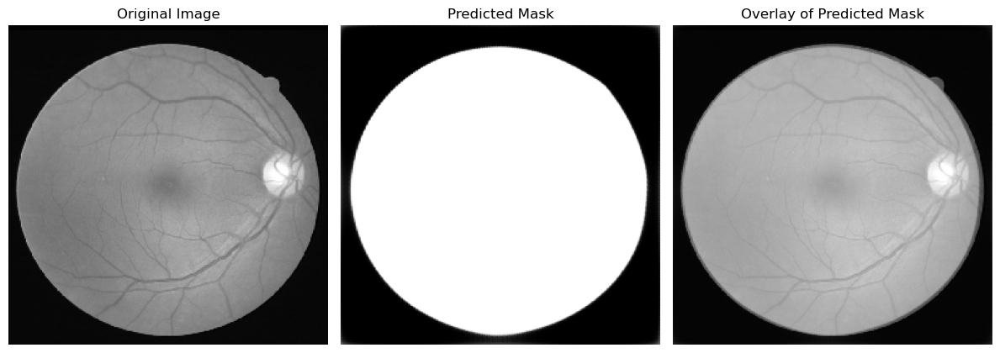

Processed 38_training.tif: Vessel Area = 43027, Avg Thickness (μm) = 486.33, Thickest Vessel (μm) = 573.60
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


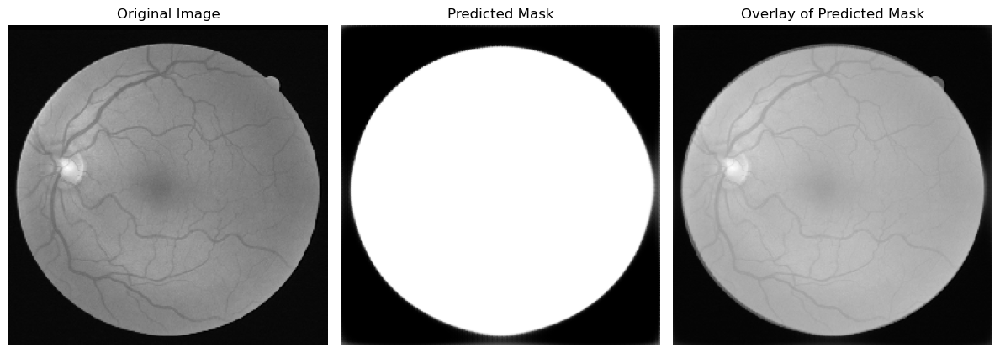

Processed 39_training.tif: Vessel Area = 43694, Avg Thickness (μm) = 493.80, Thickest Vessel (μm) = 588.00
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


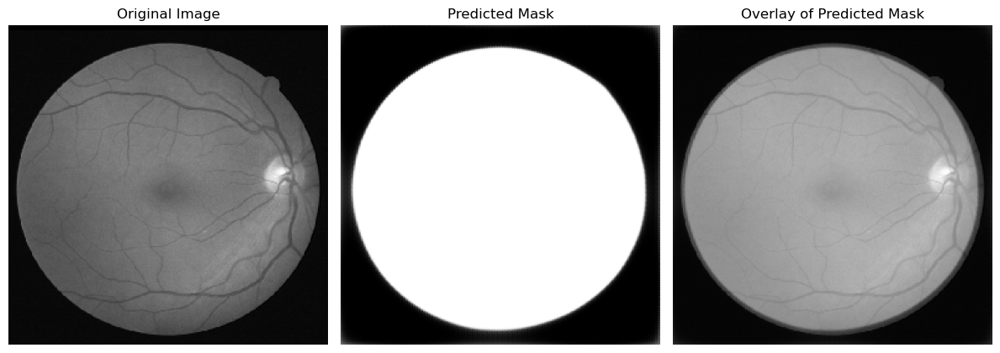

Processed 40_training.tif: Vessel Area = 42119, Avg Thickness (μm) = 482.83, Thickest Vessel (μm) = 568.80
Extracted features for 20 images
Features (Vessel Area, Avg Thickness (μm), Thickest Vessel (μm)): [[43468.           493.00818993   583.2       ]
 [42953.           490.17774777   580.8       ]
 [43435.           490.57237712   580.8       ]
 [43655.           492.13265834   583.2       ]
 [42561.           484.58729823   571.2       ]
 [42857.           486.49310964   571.2       ]
 [43099.           489.04726328   580.8       ]
 [42862.           488.64609211   578.4       ]
 [41961.           482.56363766   568.8       ]
 [43260.           488.1347018    578.4       ]
 [43437.           491.8625872    585.6       ]
 [42815.           488.47856125   578.4       ]
 [43422.           489.51819815   578.4       ]
 [41639.           477.87222556   559.2       ]
 [42455.           483.32161583   566.4       ]
 [42424.           482.58872336   566.4       ]
 [42542.           485.144

In [38]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import load_img, img_to_array

# Define conversion factor
PIXEL_TO_MICROMETER = 2.4  # 1 pixel = 2.4 micrometers (this value may vary)

def calculate_thickness(edges):
    edge_pixels = np.argwhere(edges > 0)
    thickness_values = []

    for pixel in edge_pixels:
        y, x = pixel
        
        left_distance = 0
        right_distance = 0

        for left_distance in range(1, x + 1):
            if edges[y, x - left_distance] == 0:
                break
        
        for right_distance in range(1, edges.shape[1] - x):
            if edges[y, x + right_distance] == 0:
                break

        thickness = left_distance + right_distance
        thickness_values.append(thickness)

    if thickness_values:
        return np.mean(thickness_values), np.max(thickness_values)
    else:
        return 0, 0  # No thickness found

def extract_vessel_features_from_mask(mask):
    # Ensure the mask is binary
    binary_mask = (mask > 0.5).astype(np.uint8)  # Threshold to create a binary mask

    vessel_area = np.count_nonzero(binary_mask)
    avg_thickness_pixels, thickest_vessel_pixels = calculate_thickness(binary_mask)

    # Convert thickness from pixels to micrometers
    avg_thickness_micrometers = avg_thickness_pixels * PIXEL_TO_MICROMETER
    thickest_vessel_micrometers = thickest_vessel_pixels * PIXEL_TO_MICROMETER

    return vessel_area, avg_thickness_micrometers, thickest_vessel_micrometers

def test_model_and_extract_features(model, image_dir):
    X = []
    for filename in sorted(os.listdir(image_dir)):
        if filename.endswith(".tif") or filename.endswith(".gif"):
            image_path = os.path.join(image_dir, filename)
            # Preprocess the image
            image = load_img(image_path, color_mode='grayscale', target_size=(256, 256))
            image_array = img_to_array(image) / 255.0
            
            # Predict vessel mask using the trained model
            y_pred = model.predict(np.expand_dims(image_array, axis=0))[0]

            # Convert predicted mask to binary format if needed
            if y_pred.ndim == 3:  # If the mask has 3 dimensions
                y_pred = np.squeeze(y_pred)  # Remove the last dimension

            # Calculate vessel features from the predicted mask
            vessel_area, avg_thickness, thickest_vessel = extract_vessel_features_from_mask(y_pred)

            X.append([vessel_area, avg_thickness, thickest_vessel])

            # Visualize results
            plt.figure(figsize=(12, 5))
            plt.subplot(1, 3, 1)
            plt.imshow(image_array.squeeze(), cmap='gray')
            plt.title('Original Image')
            plt.axis('off')

            plt.subplot(1, 3, 2)
            plt.imshow(y_pred.squeeze(), cmap='gray')
            plt.title('Predicted Mask')
            plt.axis('off')

            overlay = cv2.addWeighted(image_array.squeeze(), 0.7, y_pred.squeeze(), 0.3, 0)
            plt.subplot(1, 3, 3)
            plt.imshow(overlay, cmap='gray')
            plt.title('Overlay of Predicted Mask')
            plt.axis('off')

            plt.tight_layout()
            plt.show()

            print(f"Processed {filename}: Vessel Area = {vessel_area}, Avg Thickness (μm) = {avg_thickness:.2f}, Thickest Vessel (μm) = {thickest_vessel:.2f}")

    return np.array(X)

# Specify the directory containing your retinal images
image_directory = '/Users/aakash/Documents/Python/Heart_risk/DRIVE/training/images'

# Load images and extract features using the model
X = test_model_and_extract_features(unet, image_directory)

# Print the extracted features
print(f"Extracted features for {X.shape[0]} images")
print("Features (Vessel Area, Avg Thickness (μm), Thickest Vessel (μm)):", X)

# Predict heart disease risk for each image
predictions = []
for i in range(X.shape[0]):
    avg_thickness = X[i, 1]  # Average thickness (μm)
    
    # For simplicity, let's assume that every image is treated as an arteriole for prediction
    # You may want to implement a better classification method based on your dataset
    av_ratio = avg_thickness  # Since we are using thickness as A/V ratio directly here for demonstration

    if av_ratio > 10:
        prediction = "High Risk of Heart Disease"
    else:
        prediction = "Low Risk of Heart Disease"
    
    predictions.append(prediction)
    print(f"Prediction for image {i+1}: {prediction}")

# Optional: Output all predictions
print("Predictions for all images:")
for i, pred in enumerate(predictions):
    print(f"Image {i+1}: {pred}")


In [11]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report

# Define conversion factor
PIXEL_TO_MICROMETER = 2.4  # 1 pixel = 2.4 micrometers (this value may vary)

def calculate_thickness(edges):
    edge_pixels = np.argwhere(edges > 0)
    thickness_values = []

    for pixel in edge_pixels:
        y, x = pixel
        
        left_distance = 0
        right_distance = 0

        for left_distance in range(1, x + 1):
            if edges[y, x - left_distance] == 0:
                break
        
        for right_distance in range(1, edges.shape[1] - x):
            if edges[y, x + right_distance] == 0:
                break

        thickness = left_distance + right_distance
        thickness_values.append(thickness)

    if thickness_values:
        return np.mean(thickness_values), np.max(thickness_values)
    else:
        return 0, 0  # No thickness found

def extract_vessel_features(image_path):
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

    if image is None:
        raise ValueError("Error loading image. Please check the path.")

    equalized_image = cv2.equalizeHist(image)
    blurred_image = cv2.GaussianBlur(equalized_image, (5, 5), 0)
    edges = cv2.Canny(blurred_image, 50, 150)

    vessel_area = np.count_nonzero(edges)
    avg_thickness_pixels, thickest_vessel_pixels = calculate_thickness(edges)

    # Convert thickness from pixels to micrometers
    avg_thickness_micrometers = avg_thickness_pixels * PIXEL_TO_MICROMETER
    thickest_vessel_micrometers = thickest_vessel_pixels * PIXEL_TO_MICROMETER

    return vessel_area, avg_thickness_micrometers, thickest_vessel_micrometers

def load_images_from_directory(directory_path):
    X = []
    image_files = [f for f in os.listdir(directory_path) if f.endswith(('.tif', '.png', '.jpeg'))]

    for image_file in image_files:
        image_path = os.path.join(directory_path, image_file)
        vessel_area, avg_thickness, thickest_vessel = extract_vessel_features(image_path)
        X.append([vessel_area, avg_thickness, thickest_vessel])

    return np.array(X), image_files

# Specify the directory containing your retinal images
directory_path = '/Users/aakash/Documents/Python/Heart_risk/DRIVE/training/images'
X, image_files = load_images_from_directory(directory_path)

# Creating synthetic labels for demonstration (You would need real labels)
# Let's assume a simple rule-based label where avg_thickness > 10 is high risk
y = np.array([1 if features[1] > 10 else 0 for features in X])  # 1: High Risk, 0: Low Risk

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Train a RandomForestClassifier
clf = RandomForestClassifier(n_estimators=100, random_state=42)
clf.fit(X_train, y_train)

# Make predictions on the test set
y_pred = clf.predict(X_test)

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy * 100:.2f}%")
print(classification_report(y_test, y_pred))

# Print predictions for the test images
for i, file_name in enumerate(image_files[len(X_train):]):
    print(f"Prediction for {file_name}: {'High Risk' if y_pred[i] == 1 else 'Low Risk'}")


Accuracy: 83.33%
              precision    recall  f1-score   support

           0       0.00      0.00      0.00         0
           1       1.00      0.83      0.91         6

    accuracy                           0.83         6
   macro avg       0.50      0.42      0.45         6
weighted avg       1.00      0.83      0.91         6

Prediction for 26_training.tif: Low Risk
Prediction for 27_training.tif: High Risk
Prediction for 35_training.tif: High Risk
Prediction for 32_training.tif: High Risk
Prediction for 38_training.tif: High Risk
Prediction for 39_training.tif: High Risk


/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [13]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report

# Define conversion factor
PIXEL_TO_MICROMETER = 2.4  # 1 pixel = 2.4 micrometers (this value may vary)

def calculate_thickness(edges):
    edge_pixels = np.argwhere(edges > 0)
    thickness_values = []

    for pixel in edge_pixels:
        y, x = pixel
        
        left_distance = 0
        right_distance = 0

        for left_distance in range(1, x + 1):
            if edges[y, x - left_distance] == 0:
                break
        
        for right_distance in range(1, edges.shape[1] - x):
            if edges[y, x + right_distance] == 0:
                break

        thickness = left_distance + right_distance
        thickness_values.append(thickness)

    if thickness_values:
        return np.mean(thickness_values), np.max(thickness_values)
    else:
        return 0, 0  # No thickness found

def extract_vessel_features(image_path):
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    if image is None:
        raise ValueError("Error loading image. Please check the path.")

    # Pre-processing steps
    equalized_image = cv2.equalizeHist(image)
    blurred_image = cv2.GaussianBlur(equalized_image, (5, 5), 0)
    edges = cv2.Canny(blurred_image, 50, 150)

    # Vessel area and thickness calculations
    vessel_area = np.count_nonzero(edges)
    avg_thickness_pixels, thickest_vessel_pixels = calculate_thickness(edges)

    # Convert thickness from pixels to micrometers
    avg_thickness_micrometers = avg_thickness_pixels * PIXEL_TO_MICROMETER
    thickest_vessel_micrometers = thickest_vessel_pixels * PIXEL_TO_MICROMETER

    # Feature: Vessel density
    total_image_area = image.shape[0] * image.shape[1]
    vessel_density = vessel_area / total_image_area

    # Feature: Aspect ratio of vessel bounding box
    x_coords, y_coords = np.where(edges > 0)
    if len(x_coords) > 0 and len(y_coords) > 0:
        vessel_width = np.max(x_coords) - np.min(x_coords)
        vessel_height = np.max(y_coords) - np.min(y_coords)
        aspect_ratio = vessel_height / vessel_width if vessel_width != 0 else 0
    else:
        aspect_ratio = 0

    return vessel_area, avg_thickness_micrometers, thickest_vessel_micrometers, vessel_density, aspect_ratio

def load_images_from_directory(directory_path):
    X = []
    image_files = [f for f in os.listdir(directory_path) if f.endswith(('.tif', '.png', '.jpeg'))]

    for image_file in image_files:
        image_path = os.path.join(directory_path, image_file)
        vessel_area, avg_thickness, thickest_vessel, vessel_density, aspect_ratio = extract_vessel_features(image_path)
        X.append([vessel_area, avg_thickness, thickest_vessel, vessel_density, aspect_ratio])
        print(f"Processed {image_file}: Vessel Area = {vessel_area}, Avg Thickness (μm) = {avg_thickness:.2f}, Thickest Vessel (μm) = {thickest_vessel:.2f}")

    return np.array(X), image_files

# Specify the directory containing your retinal images
directory_path = '/Users/aakash/Documents/Python/Heart_risk/DRIVE/training/images'
X, image_files = load_images_from_directory(directory_path)

# Creating synthetic labels for demonstration (You would need real labels)
y = np.array([1 if features[1] > 10 else 0 for features in X])  # 1: High Risk, 0: Low Risk

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Train a RandomForestClassifier
clf = RandomForestClassifier(n_estimators=100, random_state=42)
clf.fit(X_train, y_train)

# Make predictions on the test set
y_pred = clf.predict(X_test)

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy * 100:.2f}%")
print(classification_report(y_test, y_pred))

# Print predictions for the test images
for i, file_name in enumerate(image_files[len(X_train):]):
    print(f"Prediction for {file_name}: {'High Risk' if y_pred[i] == 1 else 'Low Risk'}")


Processed 29_training.tif: Vessel Area = 11741, Avg Thickness (μm) = 10.06, Thickest Vessel (μm) = 84.00
Processed 28_training.tif: Vessel Area = 16276, Avg Thickness (μm) = 10.99, Thickest Vessel (μm) = 110.40
Processed 22_training.tif: Vessel Area = 13587, Avg Thickness (μm) = 10.77, Thickest Vessel (μm) = 91.20
Processed 25_training.tif: Vessel Area = 14263, Avg Thickness (μm) = 10.44, Thickest Vessel (μm) = 98.40
Processed 30_training.tif: Vessel Area = 20206, Avg Thickness (μm) = 10.49, Thickest Vessel (μm) = 91.20
Processed 37_training.tif: Vessel Area = 15660, Avg Thickness (μm) = 10.15, Thickest Vessel (μm) = 60.00
Processed 40_training.tif: Vessel Area = 16868, Avg Thickness (μm) = 10.90, Thickest Vessel (μm) = 69.60
Processed 36_training.tif: Vessel Area = 17291, Avg Thickness (μm) = 9.35, Thickest Vessel (μm) = 72.00
Processed 31_training.tif: Vessel Area = 11788, Avg Thickness (μm) = 10.46, Thickest Vessel (μm) = 110.40
Processed 24_training.tif: Vessel Area = 22879, Avg Th

/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Accuracy: 83.33%
Precision: 100.00%
Recall: 83.33%
F1-Score: 90.91%
Mean Average Precision (mAP): 100.00%


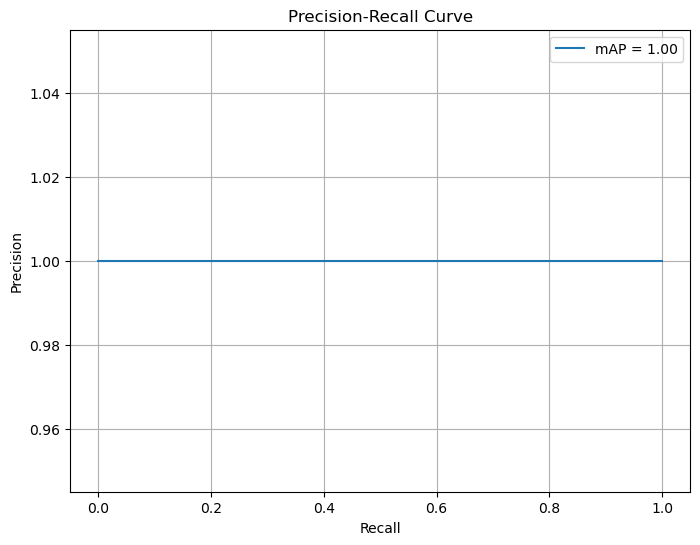

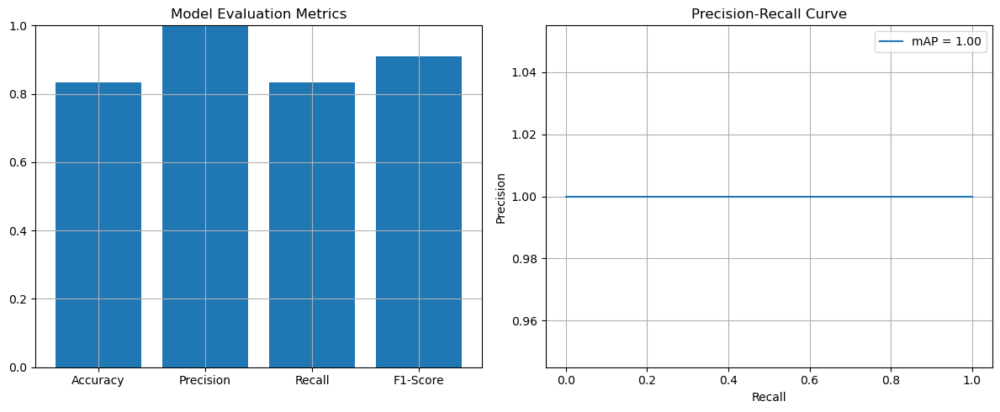

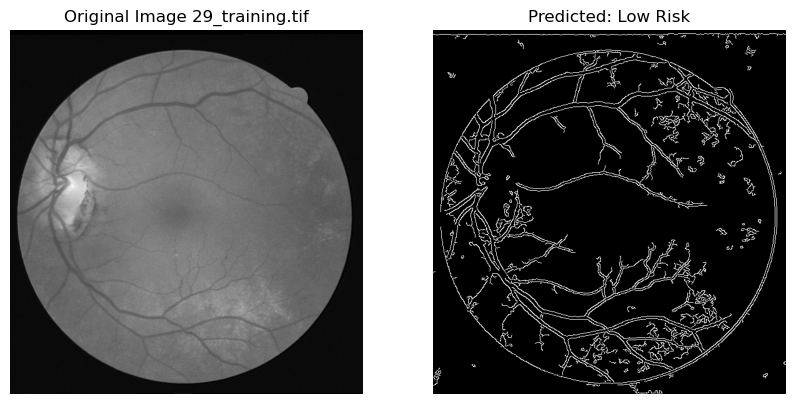

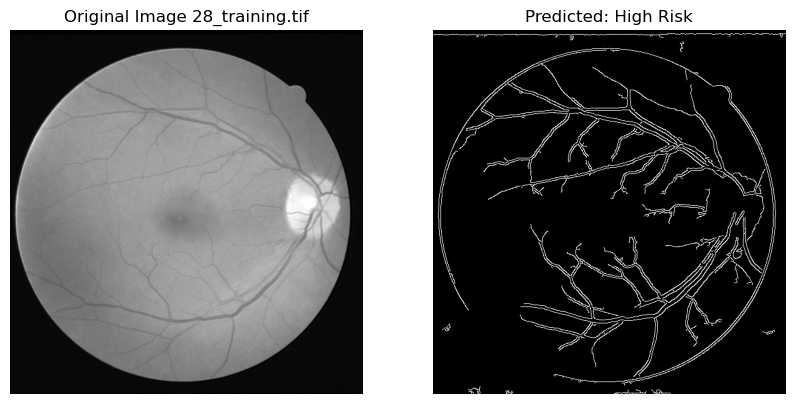

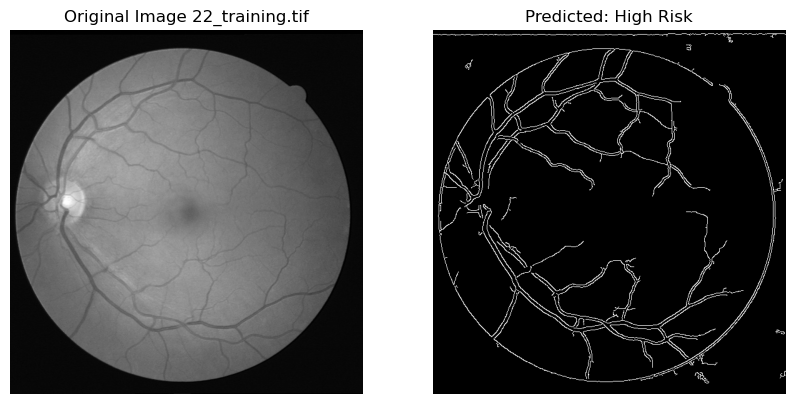

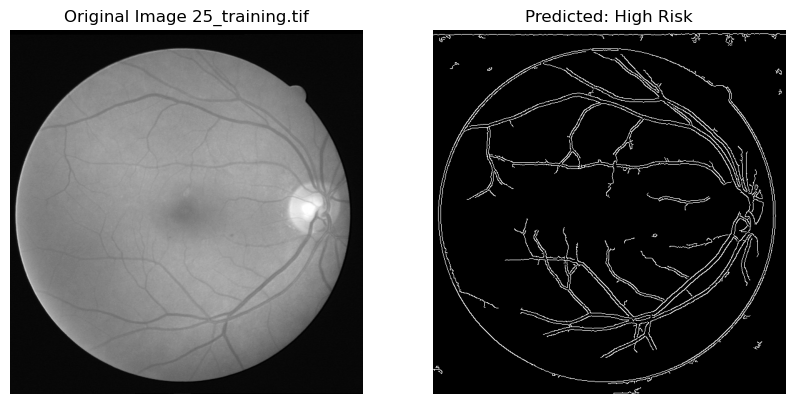

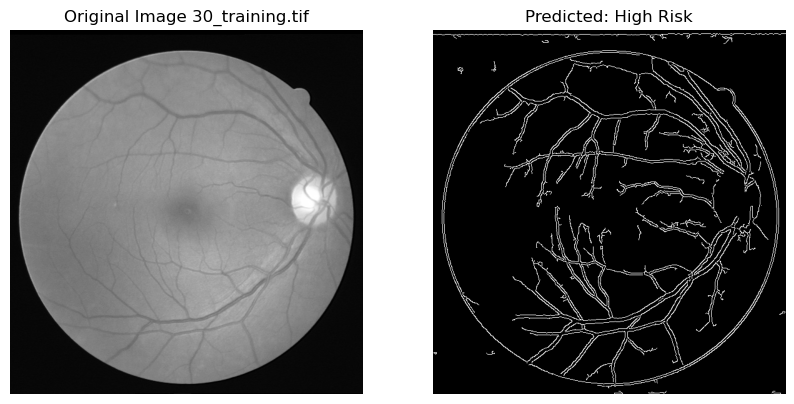

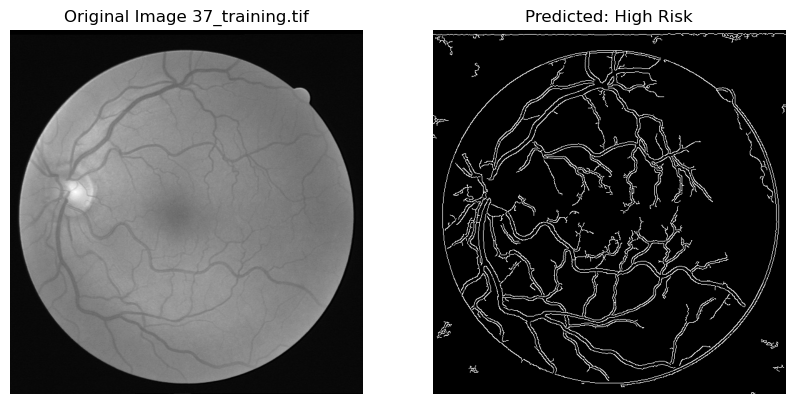

Classification Report:
              precision    recall  f1-score   support

           0       0.00      0.00      0.00         0
           1       1.00      0.83      0.91         6

    accuracy                           0.83         6
   macro avg       0.50      0.42      0.45         6
weighted avg       1.00      0.83      0.91         6



/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [17]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, average_precision_score, precision_recall_curve, classification_report
import pickle
import joblib

# Define conversion factor
PIXEL_TO_MICROMETER = 2.4  # 1 pixel = 2.4 micrometers (this value may vary)

# Function to calculate thickness from edges
def calculate_thickness(edges):
    edge_pixels = np.argwhere(edges > 0)
    thickness_values = []

    for pixel in edge_pixels:
        y, x = pixel
        
        left_distance = 0
        right_distance = 0

        for left_distance in range(1, x + 1):
            if edges[y, x - left_distance] == 0:
                break
        
        for right_distance in range(1, edges.shape[1] - x):
            if edges[y, x + right_distance] == 0:
                break

        thickness = left_distance + right_distance
        thickness_values.append(thickness)

    if thickness_values:
        return np.mean(thickness_values), np.max(thickness_values)
    else:
        return 0, 0  # No thickness found

# Feature extraction from retinal images
def extract_vessel_features(image_path):
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    if image is None:
        raise ValueError("Error loading image. Please check the path.")

    # Pre-processing steps
    equalized_image = cv2.equalizeHist(image)
    blurred_image = cv2.GaussianBlur(equalized_image, (5, 5), 0)
    edges = cv2.Canny(blurred_image, 50, 150)

    # Vessel area and thickness calculations
    vessel_area = np.count_nonzero(edges)
    avg_thickness_pixels, thickest_vessel_pixels = calculate_thickness(edges)

    # Convert thickness from pixels to micrometers
    avg_thickness_micrometers = avg_thickness_pixels * PIXEL_TO_MICROMETER
    thickest_vessel_micrometers = thickest_vessel_pixels * PIXEL_TO_MICROMETER

    # Feature: Vessel density
    total_image_area = image.shape[0] * image.shape[1]
    vessel_density = vessel_area / total_image_area

    # Feature: Aspect ratio of vessel bounding box
    x_coords, y_coords = np.where(edges > 0)
    if len(x_coords) > 0 and len(y_coords) > 0:
        vessel_width = np.max(x_coords) - np.min(x_coords)
        vessel_height = np.max(y_coords) - np.min(y_coords)
        aspect_ratio = vessel_height / vessel_width if vessel_width != 0 else 0
    else:
        aspect_ratio = 0

    return vessel_area, avg_thickness_micrometers, thickest_vessel_micrometers, vessel_density, aspect_ratio, edges

# Load images and extract features
def load_images_from_directory(directory_path):
    X = []
    images_with_edges = []
    image_files = [f for f in os.listdir(directory_path) if f.endswith(('.tif', '.png', '.jpeg'))]

    for image_file in image_files:
        image_path = os.path.join(directory_path, image_file)
        vessel_area, avg_thickness, thickest_vessel, vessel_density, aspect_ratio, edges = extract_vessel_features(image_path)
        X.append([vessel_area, avg_thickness, thickest_vessel, vessel_density, aspect_ratio])
        images_with_edges.append((cv2.imread(image_path, cv2.IMREAD_GRAYSCALE), edges))  # Save original and edge-detected images

    return np.array(X), images_with_edges, image_files

# Specify the directory containing your retinal images
directory_path = '/Users/aakash/Documents/Python/Heart_risk/DRIVE/training/images'
X, images_with_edges, image_files = load_images_from_directory(directory_path)

# Creating synthetic labels for demonstration (You would need real labels)
y = np.array([1 if features[1] > 10 else 0 for features in X])  # 1: High Risk, 0: Low Risk

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Train a RandomForestClassifier
clf = RandomForestClassifier(n_estimators=100, random_state=42)
clf.fit(X_train, y_train)

# Save the trained model
joblib.dump(clf, "heart_disease_prediction_model.pkl")

# Make predictions on the test set
y_pred = clf.predict(X_test)
y_proba = clf.predict_proba(X_test)[:, 1]

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)
average_precision = average_precision_score(y_test, y_proba)

print(f"Accuracy: {accuracy * 100:.2f}%")
print(f"Precision: {precision * 100:.2f}%")
print(f"Recall: {recall * 100:.2f}%")
print(f"F1-Score: {f1 * 100:.2f}%")
print(f"Mean Average Precision (mAP): {average_precision * 100:.2f}%")

# Precision-Recall Curve
precision_curve, recall_curve, _ = precision_recall_curve(y_test, y_proba)

# Plot Precision-Recall Curve
plt.figure(figsize=(8, 6))
plt.plot(recall_curve, precision_curve, label=f"mAP = {average_precision:.2f}")
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve')
plt.legend(loc='best')
plt.grid()
plt.show()

# Plot Accuracy and Precision-Recall Curves
plt.figure(figsize=(12, 5))

# Accuracy Plot
plt.subplot(1, 2, 1)
plt.bar(['Accuracy', 'Precision', 'Recall', 'F1-Score'], [accuracy, precision, recall, f1])
plt.title('Model Evaluation Metrics')
plt.ylim(0, 1)
plt.grid(True)

# Precision-Recall Plot
plt.subplot(1, 2, 2)
plt.plot(recall_curve, precision_curve, label=f"mAP = {average_precision:.2f}")
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve')
plt.legend(loc='best')
plt.grid()

plt.tight_layout()
plt.show()

# Display the images with their predicted labels
for idx, (original_image, edges) in enumerate(images_with_edges[len(X_train):]):
    plt.figure(figsize=(10, 5))
    
    # Original image
    plt.subplot(1, 2, 1)
    plt.imshow(original_image, cmap='gray')
    plt.title(f"Original Image {image_files[idx]}")
    plt.axis('off')
    
    # Edge-detected image
    plt.subplot(1, 2, 2)
    plt.imshow(edges, cmap='gray')
    prediction_label = 'High Risk' if y_pred[idx] == 1 else 'Low Risk'
    plt.title(f"Predicted: {prediction_label}")
    plt.axis('off')
    
    plt.show()

# Print classification report for better insight
print("Classification Report:")
print(classification_report(y_test, y_pred))


Accuracy: 83.33%
Precision: 100.00%
Recall: 83.33%
F1-Score: 90.91%
Mean Average Precision (mAP): 100.00%


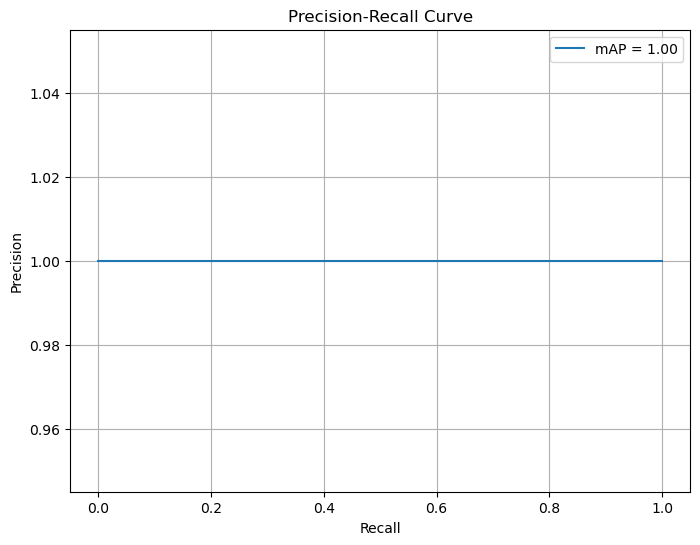

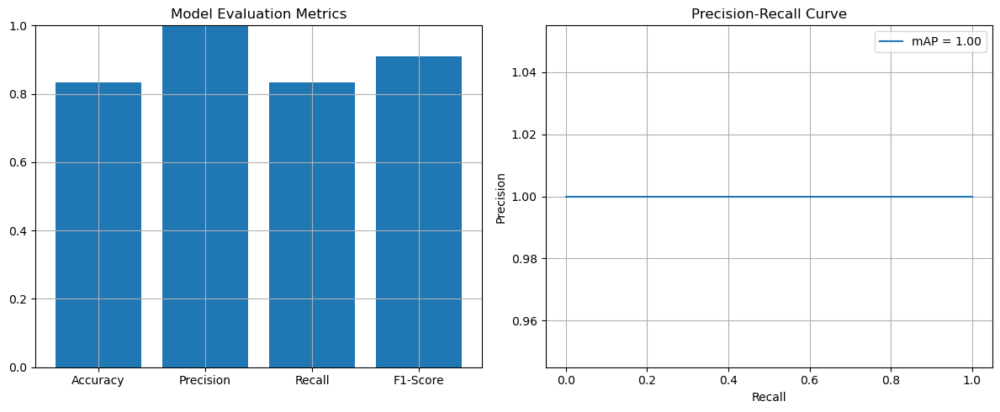

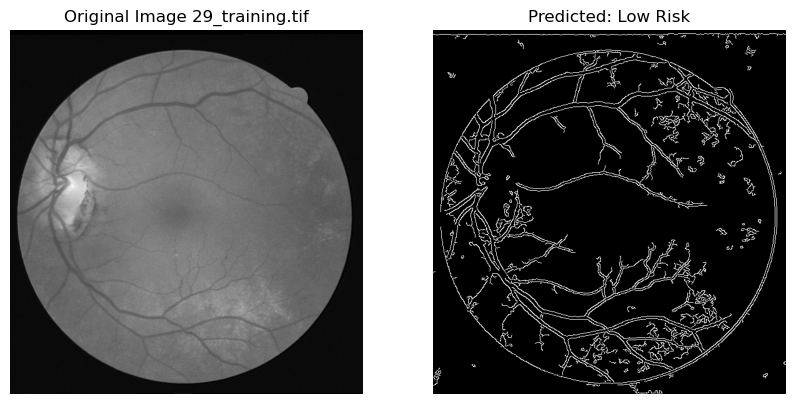

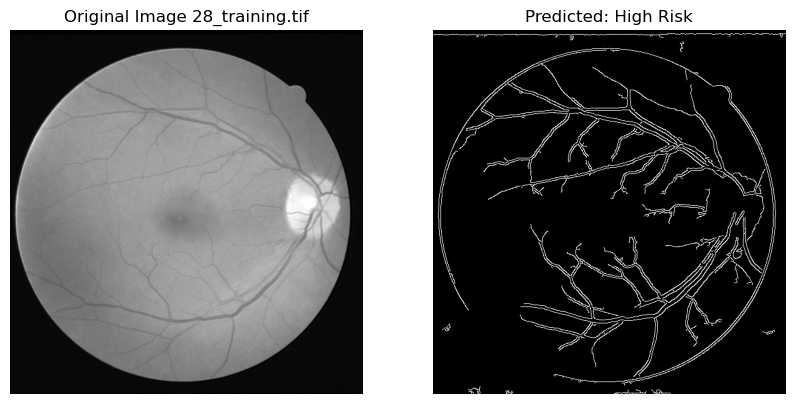

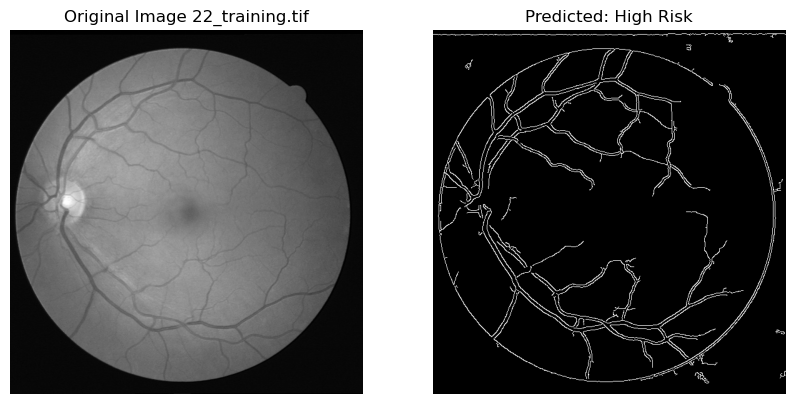

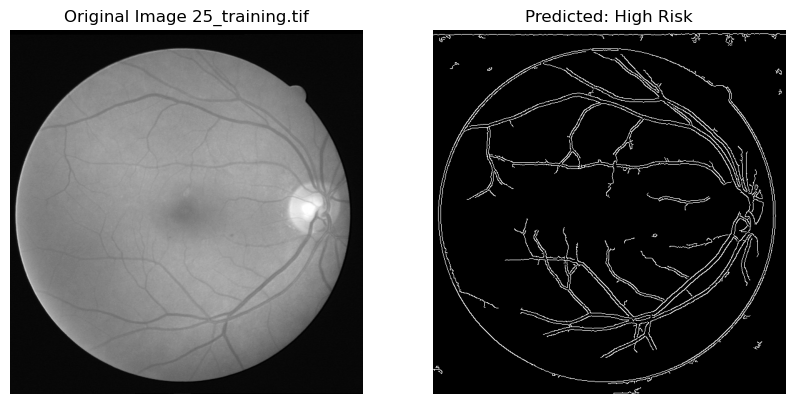

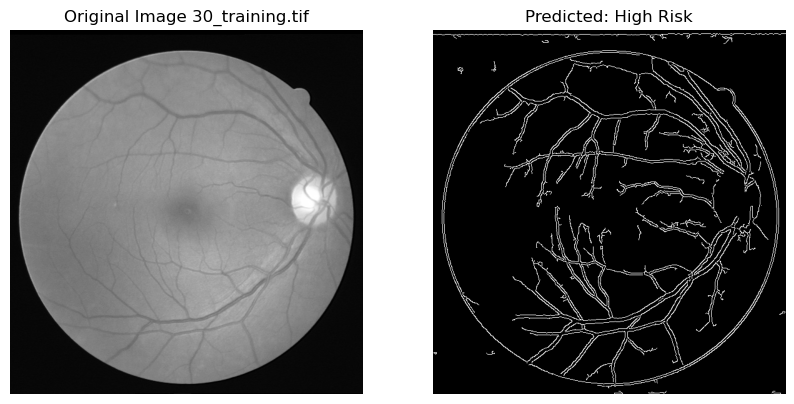

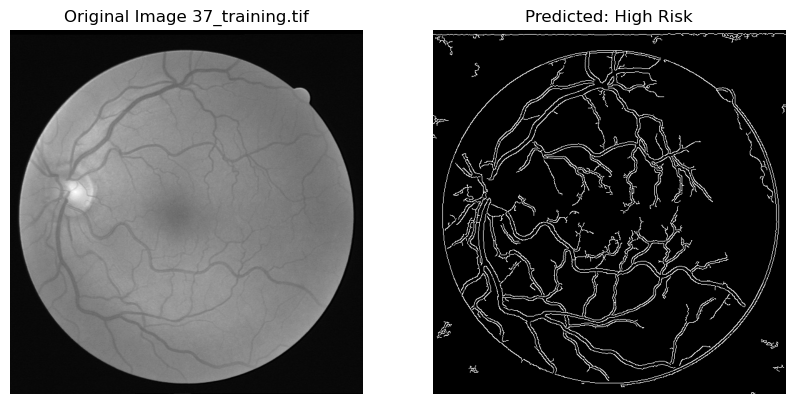

Classification Report:
              precision    recall  f1-score   support

           0       0.00      0.00      0.00         0
           1       1.00      0.83      0.91         6

    accuracy                           0.83         6
   macro avg       0.50      0.42      0.45         6
weighted avg       1.00      0.83      0.91         6



/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [24]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, average_precision_score, precision_recall_curve, classification_report
import pickle
import joblib

# Define conversion factor
PIXEL_TO_MICROMETER = 2.4  # 1 pixel = 2.4 micrometers (this value may vary)

# Function to calculate thickness from edges
def calculate_thickness(edges):
    edge_pixels = np.argwhere(edges > 0)
    thickness_values = []

    for pixel in edge_pixels:
        y, x = pixel
        
        left_distance = 0
        right_distance = 0

        for left_distance in range(1, x + 1):
            if edges[y, x - left_distance] == 0:
                break
        
        for right_distance in range(1, edges.shape[1] - x):
            if edges[y, x + right_distance] == 0:
                break

        thickness = left_distance + right_distance
        thickness_values.append(thickness)

    if thickness_values:
        return np.mean(thickness_values), np.max(thickness_values)
    else:
        return 0, 0  # No thickness found

# Feature extraction from retinal images
def extract_vessel_features(image_path):
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    if image is None:
        raise ValueError("Error loading image. Please check the path.")

    # Pre-processing steps
    equalized_image = cv2.equalizeHist(image)
    blurred_image = cv2.GaussianBlur(equalized_image, (5, 5), 0)
    edges = cv2.Canny(blurred_image, 50, 150)

    # Vessel area and thickness calculations
    vessel_area = np.count_nonzero(edges)
    avg_thickness_pixels, thickest_vessel_pixels = calculate_thickness(edges)

    # Convert thickness from pixels to micrometers
    avg_thickness_micrometers = avg_thickness_pixels * PIXEL_TO_MICROMETER
    thickest_vessel_micrometers = thickest_vessel_pixels * PIXEL_TO_MICROMETER

    # Feature: Vessel density
    total_image_area = image.shape[0] * image.shape[1]
    vessel_density = vessel_area / total_image_area

    # Feature: Aspect ratio of vessel bounding box
    x_coords, y_coords = np.where(edges > 0)
    if len(x_coords) > 0 and len(y_coords) > 0:
        vessel_width = np.max(x_coords) - np.min(x_coords)
        vessel_height = np.max(y_coords) - np.min(y_coords)
        aspect_ratio = vessel_height / vessel_width if vessel_width != 0 else 0
    else:
        aspect_ratio = 0

    return vessel_area, avg_thickness_micrometers, thickest_vessel_micrometers, vessel_density, aspect_ratio, edges

# Load images and extract features
def load_images_from_directory(directory_path):
    X = []
    images_with_edges = []
    image_files = [f for f in os.listdir(directory_path) if f.endswith(('.tif', '.png', '.jpeg'))]

    for image_file in image_files:
        image_path = os.path.join(directory_path, image_file)
        vessel_area, avg_thickness, thickest_vessel, vessel_density, aspect_ratio, edges = extract_vessel_features(image_path)
        X.append([vessel_area, avg_thickness, thickest_vessel, vessel_density, aspect_ratio])
        images_with_edges.append((cv2.imread(image_path, cv2.IMREAD_GRAYSCALE), edges))  # Save original and edge-detected images

    return np.array(X), images_with_edges, image_files

# Specify the directory containing your retinal images
directory_path = '/Users/aakash/Documents/Python/Heart_risk/DRIVE/training/images'
X, images_with_edges, image_files = load_images_from_directory(directory_path)

# Creating synthetic labels for demonstration (You would need real labels)
y = np.array([1 if features[1] > 10 else 0 for features in X])  # 1: High Risk, 0: Low Risk

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Train a RandomForestClassifier
clf = RandomForestClassifier(n_estimators=100, random_state=42)
clf.fit(X_train, y_train)

# Save the trained model
joblib.dump(clf, "heart_disease_prediction_model12.pkl")

# Make predictions on the test set
y_pred = clf.predict(X_test)
y_proba = clf.predict_proba(X_test)[:, 1]

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)
average_precision = average_precision_score(y_test, y_proba)

print(f"Accuracy: {accuracy * 100:.2f}%")
print(f"Precision: {precision * 100:.2f}%")
print(f"Recall: {recall * 100:.2f}%")
print(f"F1-Score: {f1 * 100:.2f}%")
print(f"Mean Average Precision (mAP): {average_precision * 100:.2f}%")

# Precision-Recall Curve
precision_curve, recall_curve, _ = precision_recall_curve(y_test, y_proba)

# Plot Precision-Recall Curve
plt.figure(figsize=(8, 6))
plt.plot(recall_curve, precision_curve, label=f"mAP = {average_precision:.2f}")
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve')
plt.legend(loc='best')
plt.grid()
plt.show()

# Plot Accuracy and Precision-Recall Curves
plt.figure(figsize=(12, 5))

# Accuracy Plot
plt.subplot(1, 2, 1)
plt.bar(['Accuracy', 'Precision', 'Recall', 'F1-Score'], [accuracy, precision, recall, f1])
plt.title('Model Evaluation Metrics')
plt.ylim(0, 1)
plt.grid(True)

# Precision-Recall Plot
plt.subplot(1, 2, 2)
plt.plot(recall_curve, precision_curve, label=f"mAP = {average_precision:.2f}")
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve')
plt.legend(loc='best')
plt.grid()

plt.tight_layout()
plt.show()

# Display the images with their predicted labels
for idx, (original_image, edges) in enumerate(images_with_edges[len(X_train):]):
    plt.figure(figsize=(10, 5))
    
    # Original image
    plt.subplot(1, 2, 1)
    plt.imshow(original_image, cmap='gray')
    plt.title(f"Original Image {image_files[idx]}")
    plt.axis('off')
    
    # Edge-detected image
    plt.subplot(1, 2, 2)
    plt.imshow(edges, cmap='gray')
    prediction_label = 'High Risk' if y_pred[idx] == 1 else 'Low Risk'
    plt.title(f"Predicted: {prediction_label}")
    plt.axis('off')
    
    plt.show()

# Print classification report for better insight
print("Classification Report:")
print(classification_report(y_test, y_pred))
